image.png


<h1><center><font size=10><a name='link6'>Data Science and Business Analytics</a></center></font></h1>


<h1><center> Practice Project III </center></h1>

<h1><center>Prediction of Medical Insurance Charges</center></h1>



<h1><center> By </center></h1>



<h1><center>Hayford Osumanu </center></h1>



<h1><center>December  2022 </center></h1>


image.png

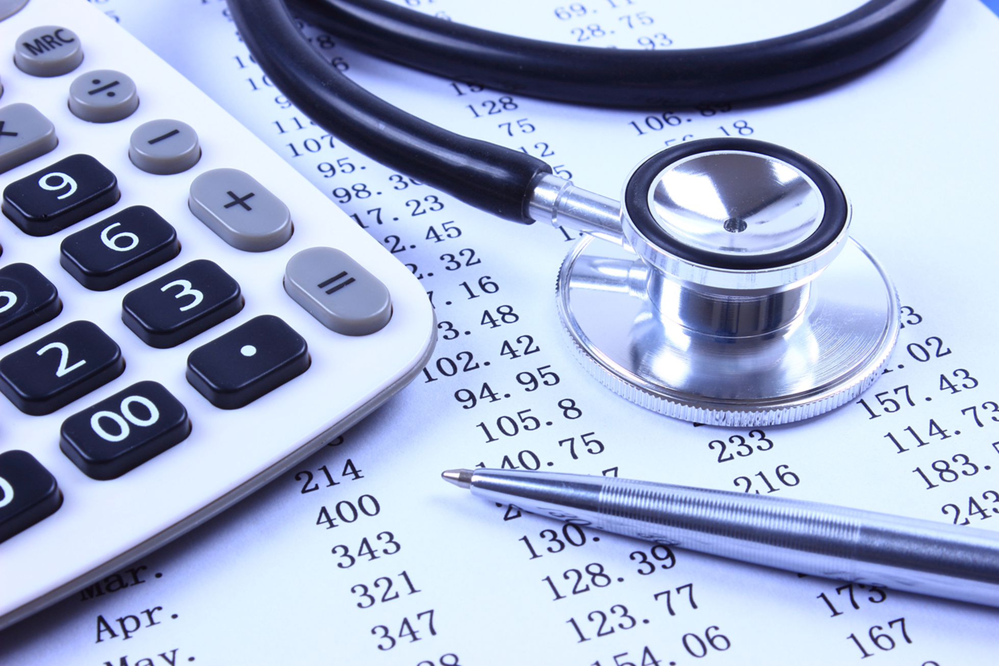

image.png

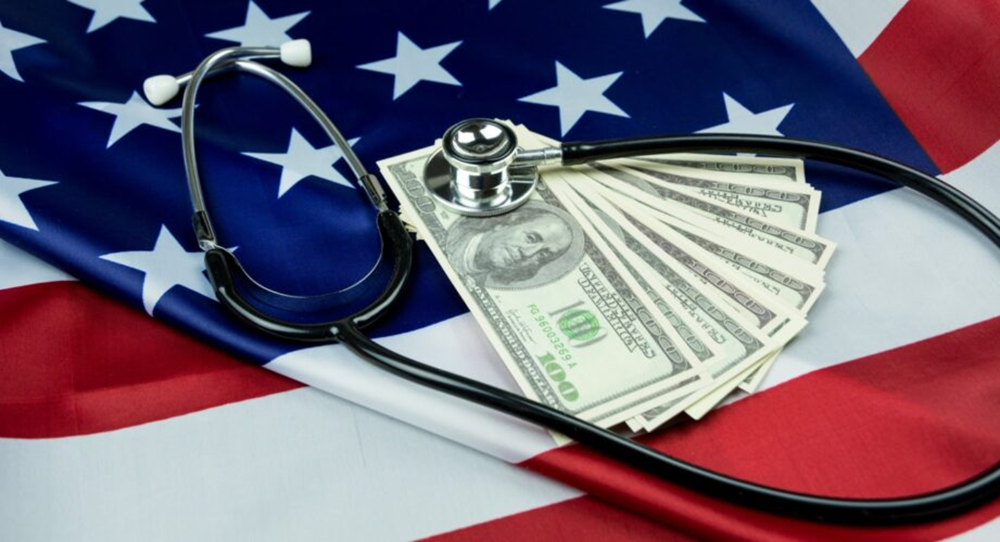

image.png

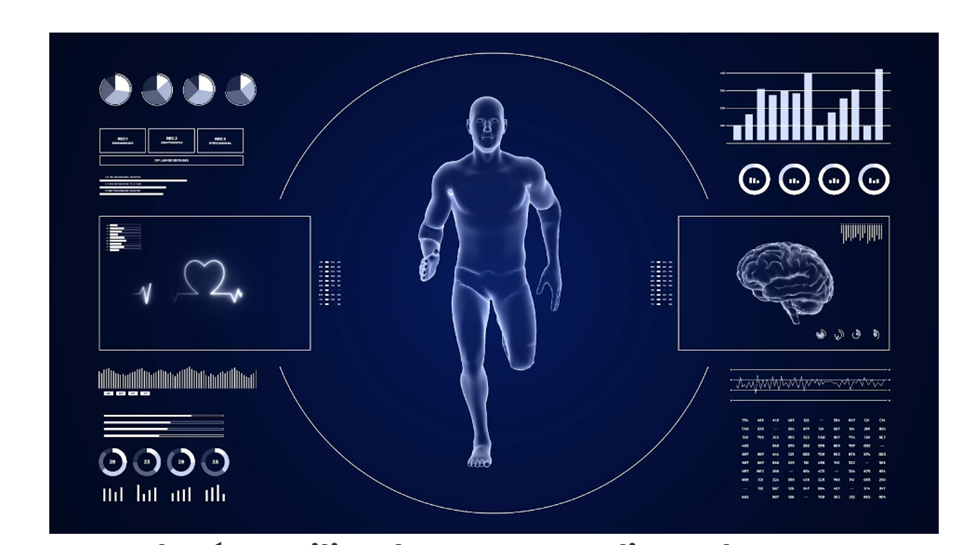

image.png

## Problem Statement

### Context:

Many factors that affect how much you pay for health insurance are not within your control. Nonetheless, it's good to have an understanding of what they are. Here are some factors that affect how much health insurance premiums cost

age: age of primary beneficiary

sex: insurance contractor gender, female, male

bmi: Body mass index, providing an understanding of body, weights that are relatively high or low relative to height, objective index of body weight (kg / m ^ 2) using the ratio of height to weight, ideally 18.5 to 24.9

children: Number of children covered by health insurance / Number of dependents

smoker: Smoking

region: the beneficiary's residential area in the US, northeast, southeast, southwest, northwest


image.png

## Objective of the Project

In this project, we are going to extract some important insights from a dataset that contains details about the background of a person who is purchasing medical insurance along with what amount of premium is charged to those individuals as well using Machine Learning in Python.

image.png

## Importing necessary libraries

**Let's start by importing libraries we need.**

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np   
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor,RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, StackingRegressor
from xgboost import XGBRegressor
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, train_test_split

## Python Libraries Fucntions

Python libraries make it very easy for us to handle the data and perform typical and complex tasks with a single line of code.

- Pandas – This library helps to load the data frame in a 2D array format and has multiple functions to perform analysis tasks in one go.

- Numpy – Numpy arrays are very fast and can perform large computations in a very short time.

- Matplotlib/Seaborn – This library is used to draw visualizations.

- Sklearn – This module contains multiple libraries having pre-implemented functions to perform tasks from data preprocessing to model development and evaluation.

- XGBoost – This contains the eXtreme Gradient Boosting machine learning algorithm which is one of the algorithms which helps us to achieve high accuracy on predictions.


image.png

## Reading the dataset

In [ ]:
#Loading dataset
#data=pd.read_csv("insurance.csv")

In [ ]:
# Reading the data from the local drive
data = pd.read_csv(
    "C:/Users/hayfo/OneDrive/Desktop/Data Publication/insurance.csv"
)

## Overview of the dataset

### View the first 5 rows of the dataset

In [ ]:
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### Check data types and number of non-null values for each column

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [ ]:
data.isna().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

- There are no missing values in the data.

### Summary of the dataset

In [ ]:
# Summary of continuous columns
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1338.0,39.207025,14.049960,18.0000,27.00000,39.000,51.000000,64.00000
bmi,1338.0,30.663397,6.098187,15.9600,26.29625,30.400,34.693750,53.13000
children,1338.0,1.094918,1.205493,0.0000,0.00000,1.000,2.000000,5.00000
charges,1338.0,13270.422265,12110.011237,1121.8739,4740.28715,9382.033,16639.912515,63770.42801


### Number of unique values in each column

In [ ]:
data.nunique()

age           47
sex            2
bmi          548
children       6
smoker         2
region         4
charges     1337
dtype: int64

### Number of observations in each category

In [ ]:
# Making a list of all catrgorical variables
cat_col = list(data.select_dtypes("object").columns)

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    #print("cat_col")

male      676
female    662
Name: sex, dtype: int64
no     1064
yes     274
Name: smoker, dtype: int64
southeast    364
southwest    325
northwest    325
northeast    324
Name: region, dtype: int64


In [ ]:
df = data.copy()

## <a name='link2'>Exploratory Data Analysis (EDA) Summary</a>

## Statistical summary of the numerical columns in both train and test dataset

### Statistical Summary of the Dataset

In [ ]:
# let's view the statistical summary of minimum numerical columns in the data
data.describe(include=np.number).T.style.highlight_min(color="green", axis=0)

,count,mean,std,min,25%,50%,75%,max
age,1338.000000,39.207025,14.049960,18.000000,27.000000,39.000000,51.000000,64.000000
bmi,1338.000000,30.663397,6.098187,15.960000,26.296250,30.400000,34.693750,53.130000
children,1338.000000,1.094918,1.205493,0.000000,0.000000,1.000000,2.000000,5.000000
charges,1338.000000,13270.422265,12110.011237,1121.873900,4740.287150,9382.033000,16639.912515,63770.428010


In [ ]:
# let's view the statistical summary of maximum numerical columns in the data
data.describe(include=np.number).T.style.highlight_max(color="indigo", axis=0)

,count,mean,std,min,25%,50%,75%,max
age,1338.000000,39.207025,14.049960,18.000000,27.000000,39.000000,51.000000,64.000000
bmi,1338.000000,30.663397,6.098187,15.960000,26.296250,30.400000,34.693750,53.130000
children,1338.000000,1.094918,1.205493,0.000000,0.000000,1.000000,2.000000,5.000000
charges,1338.000000,13270.422265,12110.011237,1121.873900,4740.287150,9382.033000,16639.912515,63770.428010


In [ ]:
# Extracting the Quantiles of the dataset
data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.style.highlight_max(
    color="purple", axis=0
)

,0.25,0.5,0.6,0.75,0.9,0.95,0.99
age,27.000000,39.000000,44.000000,51.000000,59.000000,62.000000,64.000000
bmi,26.296250,30.400000,32.032000,34.693750,38.619500,41.106000,46.407900
children,0.000000,1.000000,1.000000,2.000000,3.000000,3.000000,5.000000
charges,4740.287150,9382.033000,11399.857160,16639.912515,34831.719700,41181.827787,48537.480726


In [ ]:
# Extracting the Quantiles of the dataset
data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.style.highlight_min(
    color="red", axis=0
)

,0.25,0.5,0.6,0.75,0.9,0.95,0.99
age,27.000000,39.000000,44.000000,51.000000,59.000000,62.000000,64.000000
bmi,26.296250,30.400000,32.032000,34.693750,38.619500,41.106000,46.407900
children,0.000000,1.000000,1.000000,2.000000,3.000000,3.000000,5.000000
charges,4740.287150,9382.033000,11399.857160,16639.912515,34831.719700,41181.827787,48537.480726


image.png

**The below functions need to be defined to carry out the EDA.**

In [ ]:
def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (15,10))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Univariate analysis

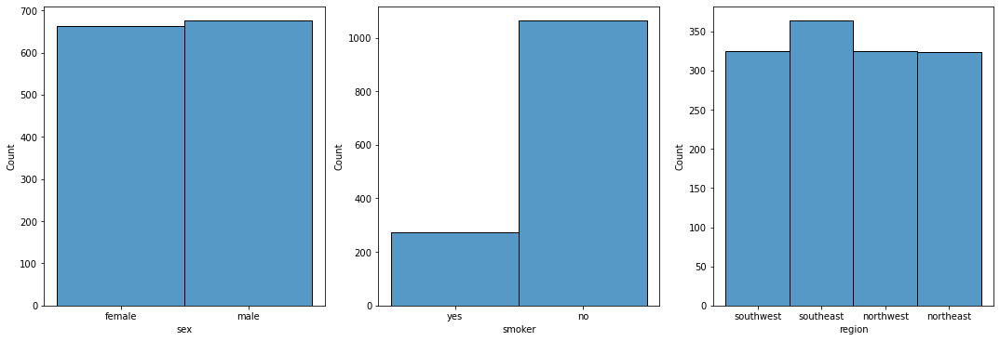

In [ ]:
# Checking the histogram plot  of the entire dataset
cols = 5
rows = 5
num_cols = data.select_dtypes(include='object').columns
fig = plt.figure( figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.histplot(x =data[col], ax = ax)
    
fig.tight_layout()  
plt.show()

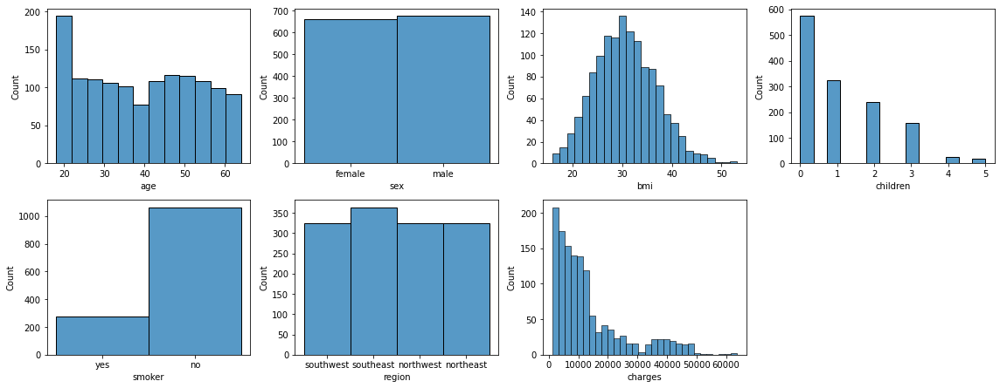

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude='category').columns
fig = plt.figure( figsize=(cols*4, rows*3))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.histplot(x =data[col], ax = ax)
    
fig.tight_layout()  
plt.show()

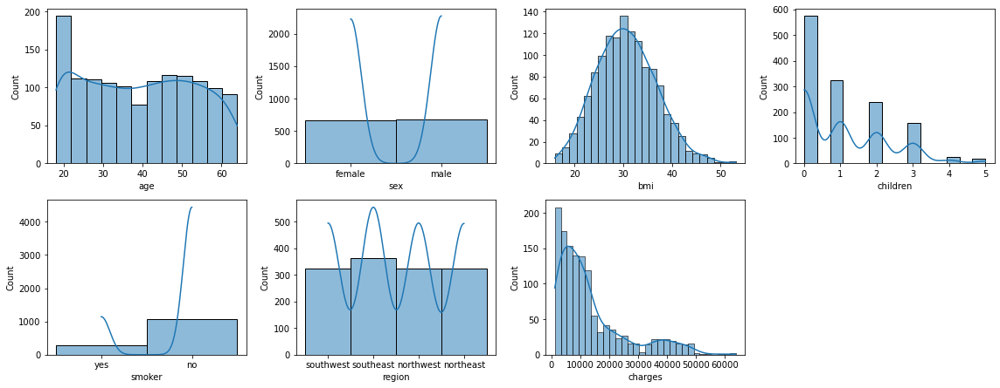

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude='category').columns
fig = plt.figure( figsize=(cols*4, rows*3))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.histplot(x =data[col], kde = True, ax = ax)
    
fig.tight_layout()  
plt.show()

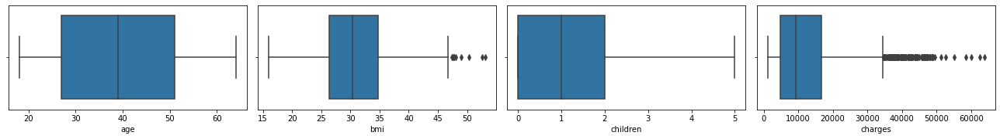

In [ ]:
# Checking the boxplot of the numerical variable of the dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (18,12))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot( rows, cols, i+1)
    
    sns.boxplot(x=data[col], ax=ax)
    
fig.tight_layout()  
plt.show()

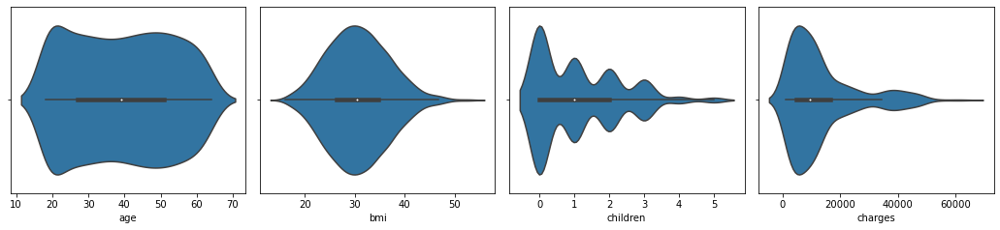

In [ ]:
# Checking the voilin plot of the numerical variables
cols = 5
rows = 5
num_cols = data.select_dtypes(exclude='object').columns
fig = plt.figure(figsize= (18,16))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot( rows, cols, i+1)
    
    sns.violinplot( x=data[col], ax=ax)
    
fig.tight_layout()  
plt.show()

### Bivariate analysis

**Correlation Check**

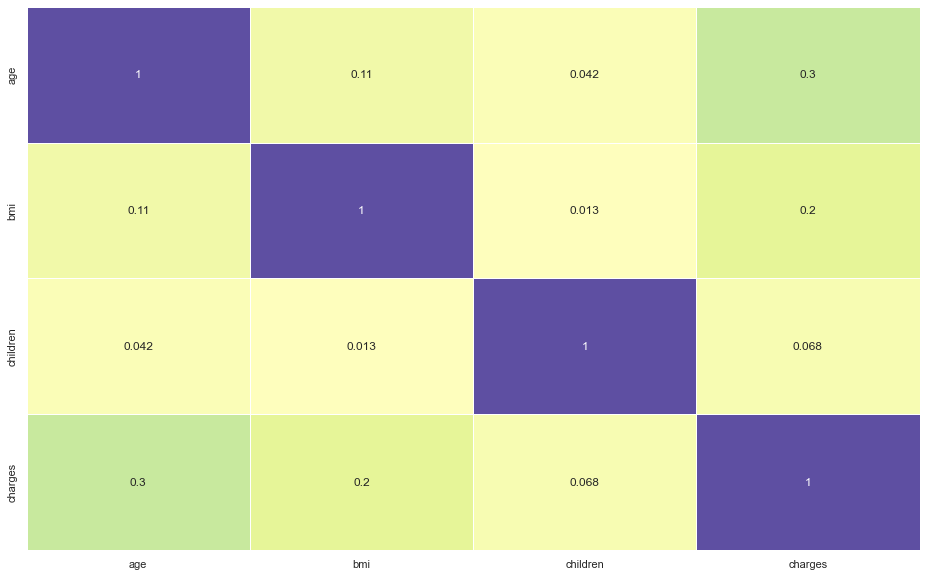

In [ ]:
sns.set(rc={'figure.figsize':(16,10)})
sns.heatmap(data.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="Spectral")
plt.show()

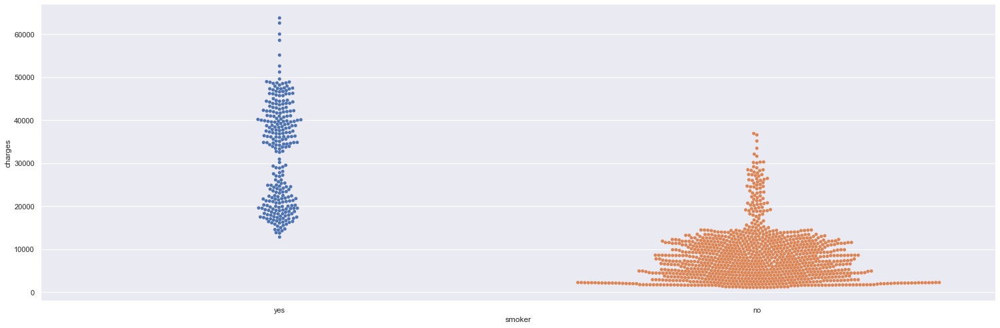

In [ ]:
sns.set(rc={'figure.figsize':(21,7)})
sns.catplot(x="smoker", y="charges", kind="swarm", data=data, height=7, aspect=3);

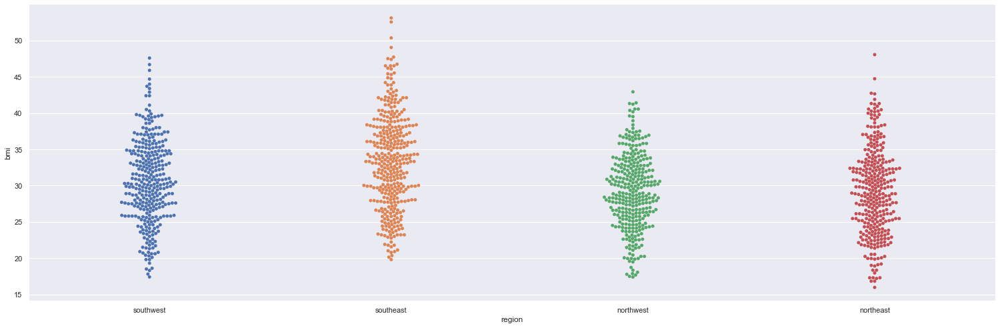

In [ ]:
sns.set(rc={'figure.figsize':(21,7)})
sns.catplot(x="region", y="bmi", kind="swarm", data=data, height=7, aspect=3);

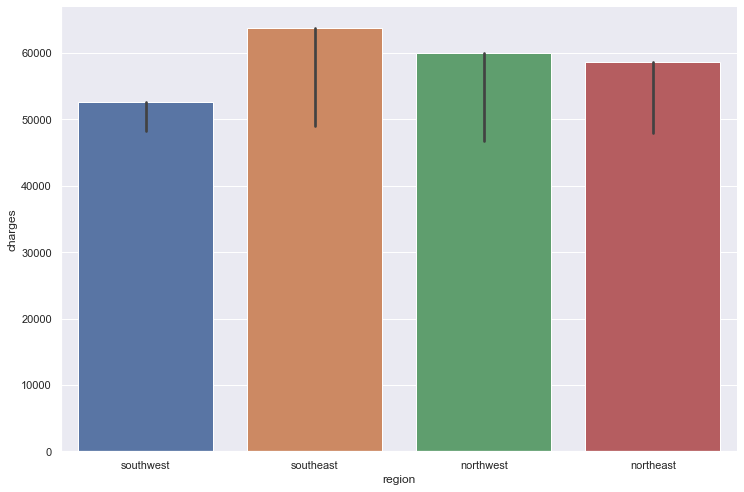

In [ ]:
sns.catplot(x="region", y="charges", data=data, kind='bar', height=7, aspect=1.5, estimator=np.max);

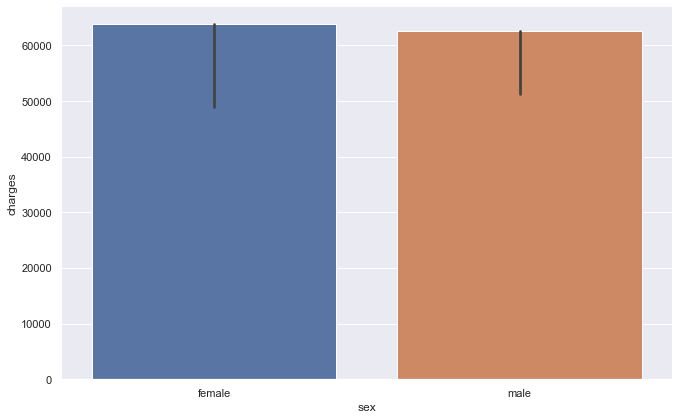

In [ ]:
sns.catplot(x="sex", y="charges", data=data, kind='bar', height=6, aspect=1.6, estimator=np.max);

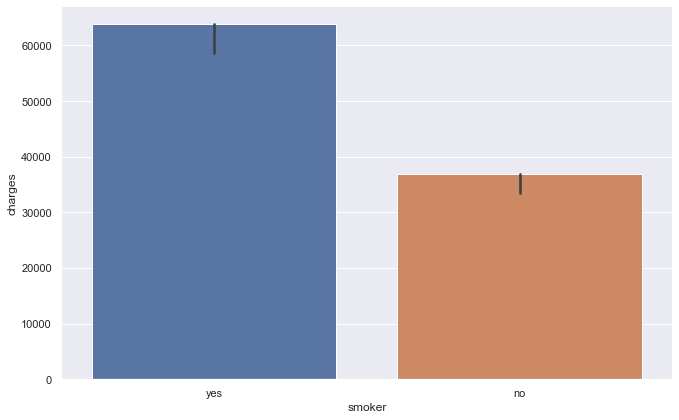

In [ ]:
sns.catplot(x="smoker", y="charges", data=data, kind='bar', height=6, aspect=1.6, estimator=np.max);

# Part III: EDA - Multivariate Data Analysis

## Boxplot Comparison Analysis

In [ ]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 3, 3))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(25, 9))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

image.png

## Comparison of the Numerical Columns

In [ ]:
# copying the data to another variable to avoid any changes to original data
df = data.copy()

In [ ]:
# Extracting the columns of the entire datasets
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

In [ ]:
# Extracting the numerical col of the datasets
col_var = ['age','bmi', 'children', 'region', 'charges'
]

In [ ]:
df[col_var].columns

Index(['age', 'bmi', 'children', 'region', 'charges'], dtype='object')

In [ ]:
data.info(
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


image.png

### BMI in Relation to Region

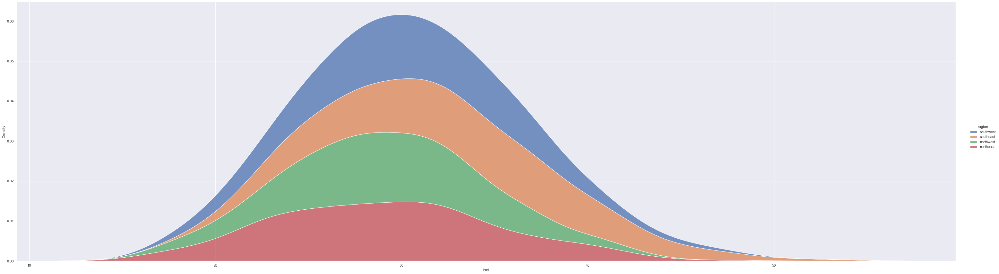

In [ ]:
# Ploting a displot of bmi vs region
sns.displot(
    data=df,
    x="bmi",
    hue="region",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for BMI vs Region
import plotly.express as px

fig = px.sunburst(
    df,
    path=["region"],
    values="bmi",
    color="bmi",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

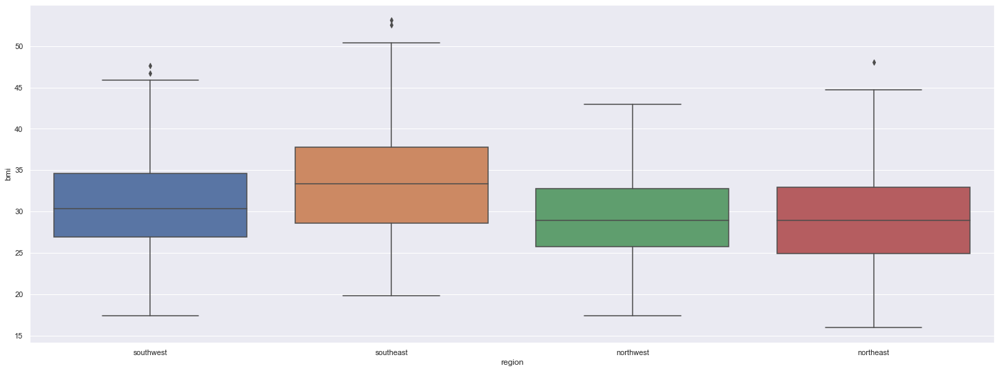

In [ ]:
# Boxplot of  BMI vs Region
plt.figure(figsize=(25, 9))
sns.boxplot(data=df, x="region", y="bmi");

In [ ]:
# Creating summary statitics pivot table for  BMI vs Region
bmi_region = df.pivot_table(
    index=["region"],
    values=["bmi"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(bmi_region)

             bmi                                               
             max       mean median     min       std        var
region                                                         
northeast  48.07  29.173503  28.88  15.960  5.937513  35.254064
northwest  42.94  29.199785  28.88  17.385  5.136765  26.386354
southeast  53.13  33.355989  33.33  19.800  6.477648  41.959923
southwest  47.60  30.596615  30.30  17.400  5.691836  32.396995


In [ ]:
# comparing 
data.groupby(['region'])['bmi'].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
northeast,324.0,29.173503,5.937513,15.960,24.86625,28.88,32.89375,48.07
northwest,325.0,29.199785,5.136765,17.385,25.74500,28.88,32.77500,42.94
southeast,364.0,33.355989,6.477648,19.800,28.57250,33.33,37.81250,53.13
southwest,325.0,30.596615,5.691836,17.400,26.90000,30.30,34.60000,47.60


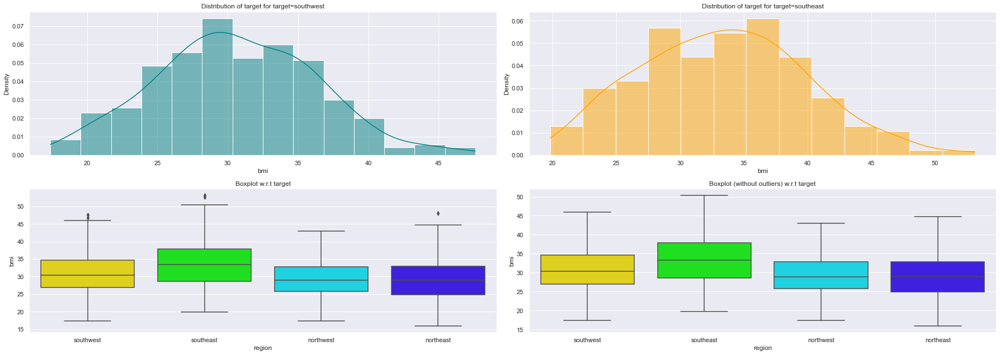

In [ ]:
distribution_plot_wrt_target(data, 'bmi', 'region') 

image.png

### BMI in Relation to Smoker

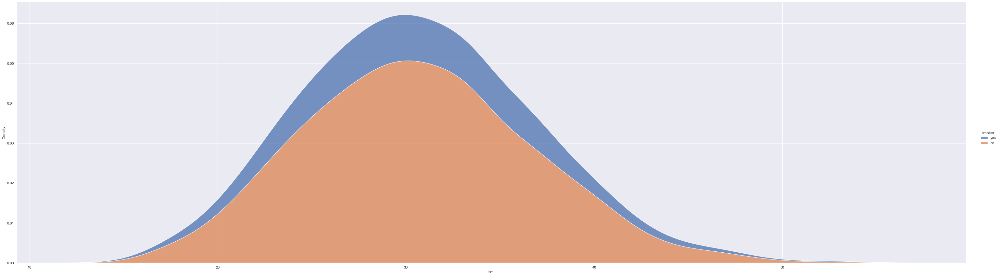

In [ ]:
# Ploting a displot of BMI vs Smoker
sns.displot(
    data=df,
    x="bmi",
    hue="smoker",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [ ]:
# Creating a sunburst chart of BMI vs Smoker
import plotly.express as px

fig = px.sunburst(
    df,
    path=["smoker"],
    values="bmi",
    color="bmi",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<AxesSubplot:xlabel='smoker', ylabel='bmi'>

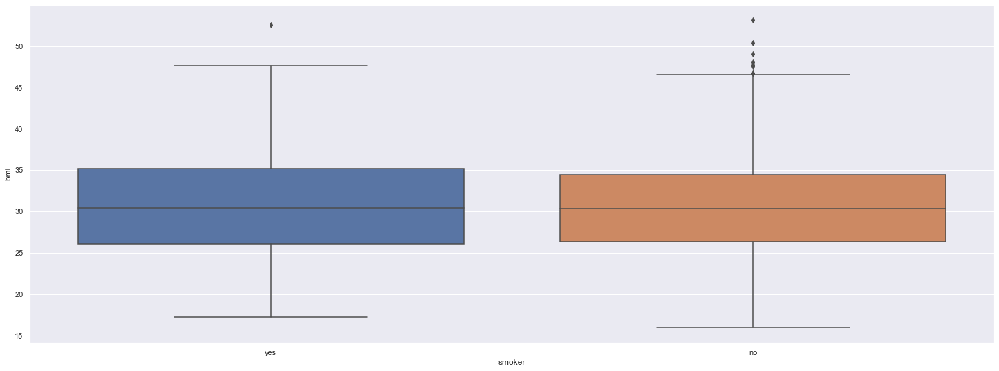

In [ ]:
# Boxplot of BMI vs Smoker
plt.figure(figsize=(25, 9))
sns.boxplot(data=df, x="smoker", y="bmi")

In [ ]:
# Creating summary statitics pivot table for BMI vs Smoker
bmi_smoker = df.pivot_table(
    index=["smoker"],
    values=["bmi"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(bmi_smoker)

          bmi                                                 
          max       mean   median     min       std        var
smoker                                                        
no      53.13  30.651795  30.3525  15.960  6.043111  36.519195
yes     52.58  30.708449  30.4475  17.195  6.318644  39.925262


In [ ]:
# comparing BMI vs Smoker
data.groupby(['smoker'])['bmi'].describe()

,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,1064.0,30.651795,6.043111,15.960,26.31500,30.3525,34.43,53.13
yes,274.0,30.708449,6.318644,17.195,26.08375,30.4475,35.20,52.58


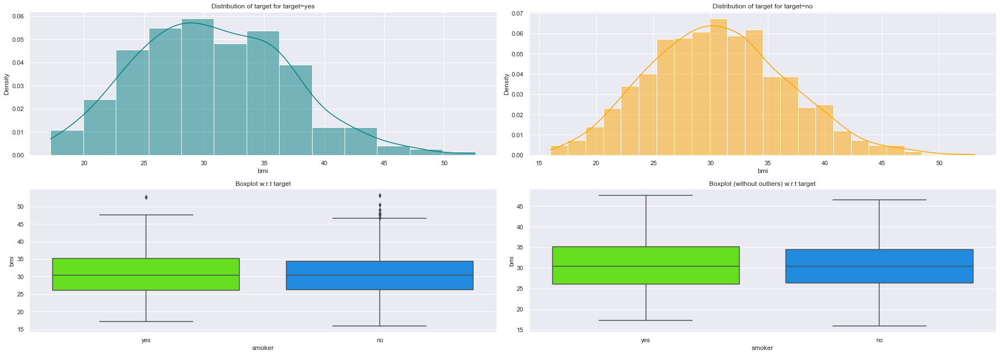

In [ ]:
distribution_plot_wrt_target(data, 'bmi', 'smoker') 

image.png

### BMI in Relation to Sex

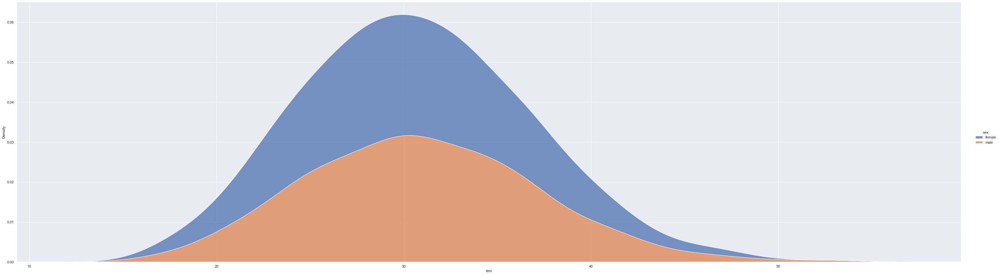

In [ ]:
# Ploting a displot of BMI vs Sex
sns.displot(
    data=df,
    x="bmi",
    hue="sex",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for BMI vs Sex
import plotly.express as px

fig = px.sunburst(
    df,
    path=["sex"],
    values="bmi",
    color="bmi",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<AxesSubplot:xlabel='sex', ylabel='bmi'>

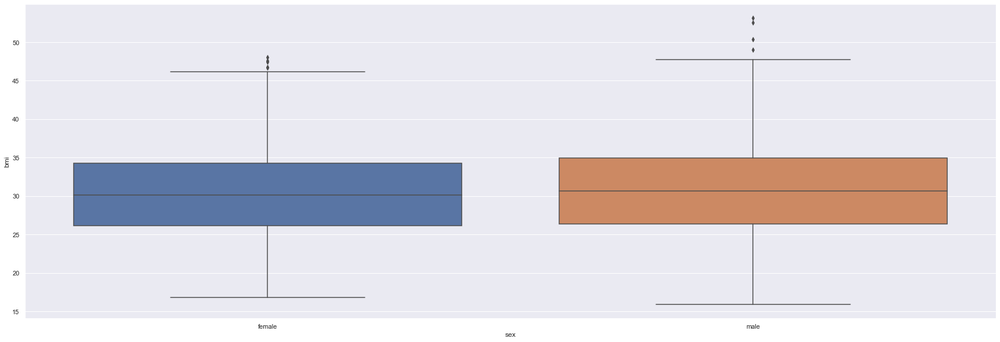

In [ ]:
# Boxplot of BMI vs Sex
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="sex", y="bmi")

In [ ]:
# Creating summary statitics pivot taable for BMI vs Sex
bmi_sex = df.pivot_table(
    index=["sex"],
    values=["bmi"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(bmi_sex)

          bmi                                                 
          max       mean   median     min       std        var
sex                                                           
female  48.07  30.377749  30.1075  16.815  6.046023  36.554395
male    53.13  30.943129  30.6875  15.960  6.140435  37.704937


In [ ]:
# comparing BMI vs Sex
data.groupby(['sex'])['bmi'].describe()

,count,mean,std,min,25%,50%,75%,max
sex,,,,,,,,
female,662.0,30.377749,6.046023,16.815,26.125,30.1075,34.31375,48.07
male,676.0,30.943129,6.140435,15.960,26.410,30.6875,34.99250,53.13


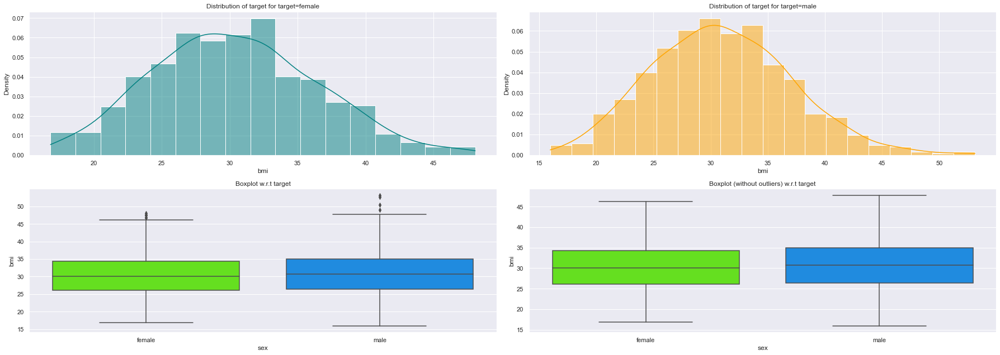

In [ ]:
distribution_plot_wrt_target(data, 'bmi', 'sex') 

image.png

### Charges in Relation to Region

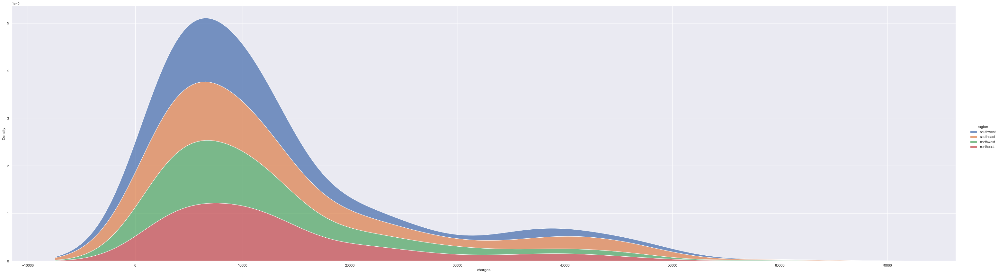

In [ ]:
# Ploting a displot of  Charges vs Region
sns.displot(
    data=df,
    x="charges",
    hue="region",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for  Charges vs Region
import plotly.express as px

fig = px.sunburst(
    data,
    path=["region"],
    values="charges",
    color="charges",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<AxesSubplot:xlabel='region', ylabel='charges'>

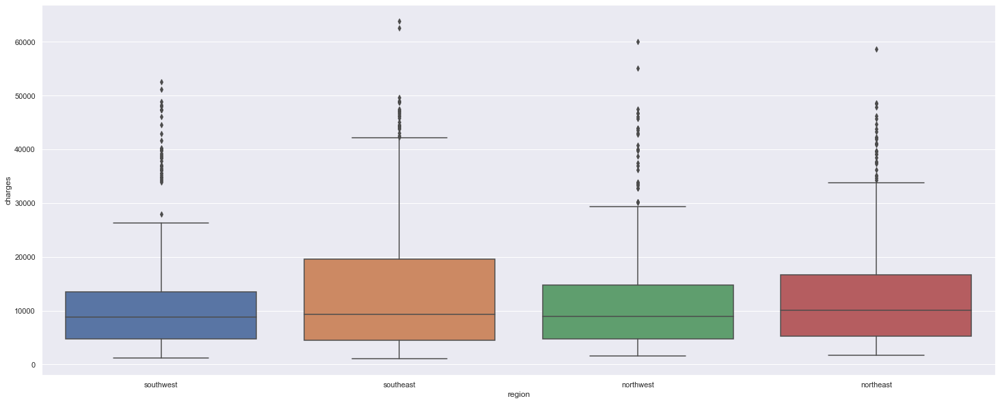

In [ ]:
#  Boxplot of  Charges vs Region
plt.figure(figsize=(25, 10))
sns.boxplot(data=df, x="region", y="charges")

In [ ]:
# Creating summary statitics pivot taable for Charges vs Region
charges_region = df.pivot_table(index=['region'], values=['charges'], aggfunc={'max','median','mean','std','var','min'})
print (charges_region)

               charges                                                       \
                   max          mean        median        min           std   
region                                                                        
northeast  58571.07448  13406.384516  10057.652025  1694.7964  11255.803066   
northwest  60021.39897  12417.575374   8965.795750  1621.3402  11072.276928   
southeast  63770.42801  14735.411438   9294.131950  1121.8739  13971.098589   
southwest  52590.82939  12346.937377   8798.593000  1241.5650  11557.179101   

                         
                    var  
region                   
northeast  1.266931e+08  
northwest  1.225953e+08  
southeast  1.951916e+08  
southwest  1.335684e+08  


In [ ]:
# comparing Charges vs Region
data.groupby(['region'])['charges'].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
northeast,324.0,13406.384516,11255.803066,1694.7964,5194.322288,10057.652025,16687.3641,58571.07448
northwest,325.0,12417.575374,11072.276928,1621.3402,4719.736550,8965.795750,14711.7438,60021.39897
southeast,364.0,14735.411438,13971.098589,1121.8739,4440.886200,9294.131950,19526.2869,63770.42801
southwest,325.0,12346.937377,11557.179101,1241.5650,4751.070000,8798.593000,13462.5200,52590.82939


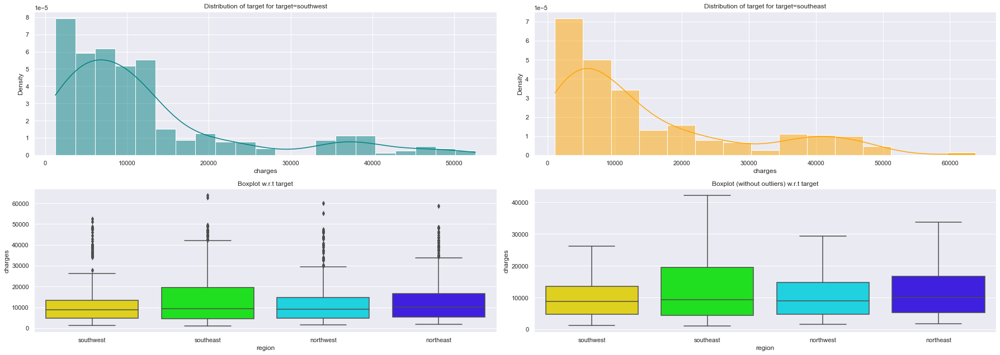

In [ ]:
distribution_plot_wrt_target(data, 'charges', 'region') ## Complete the code to find distribution of prevailing wage and case status

image.png

### Charges in Relation to Smoker

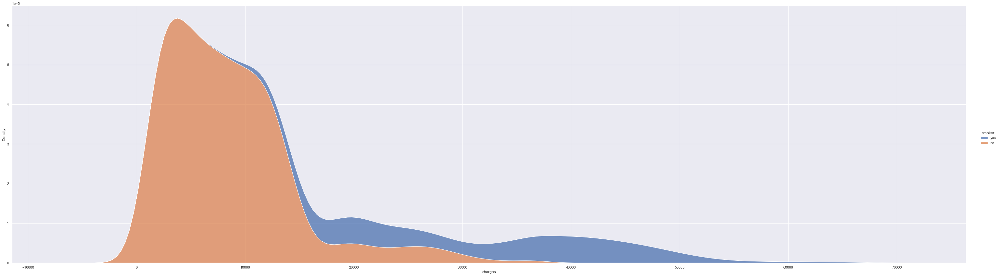

In [ ]:
# Ploting a displot of Charges vs Smoker
sns.displot(
    data=df,
    x="charges",
    hue="smoker",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for Charges vs Smoker
import plotly.express as px

fig = px.sunburst(
    df,
    path=["smoker"],
    values="charges",
    color="charges",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<AxesSubplot:xlabel='smoker', ylabel='charges'>

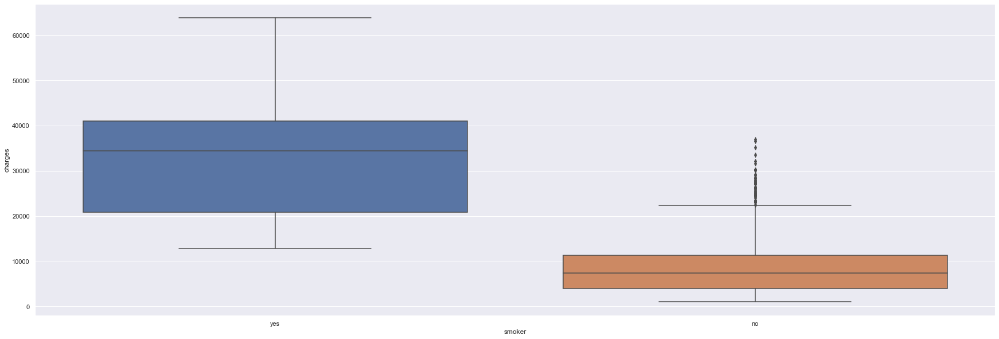

In [ ]:
# Boxplot of Charges vs Smoker
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="smoker", y="charges")

In [ ]:
# Creating summary statitics pivot taable for Charges vs Smoker
charges_smoker = df.pivot_table(
    index=["smoker"],
    values=["charges"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(charges_smoker)

            charges                                                       \
                max          mean       median         min           std   
smoker                                                                     
no      36910.60803   8434.268298   7345.40530   1121.8739   5993.781819   
yes     63770.42801  32050.231832  34456.34845  12829.4551  11541.547176   

                      
                 var  
smoker                
no      3.592542e+07  
yes     1.332073e+08  


In [ ]:
# comparing Charges vs Smoker
data.groupby(['smoker'])['charges'].describe()

,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,1064.0,8434.268298,5993.781819,1121.8739,3986.438700,7345.40530,11362.887050,36910.60803
yes,274.0,32050.231832,11541.547176,12829.4551,20826.244213,34456.34845,41019.207275,63770.42801


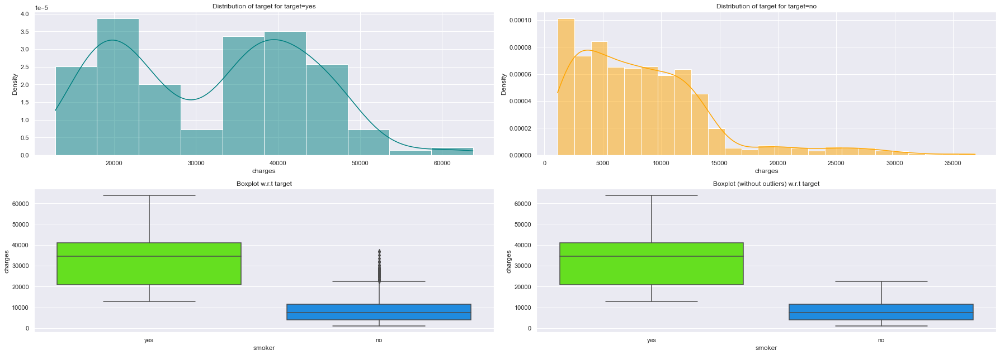

In [ ]:
# Charges vs Smoker
distribution_plot_wrt_target(data, 'charges', 'smoker') 

image.png

### Charges in Relation to Sex

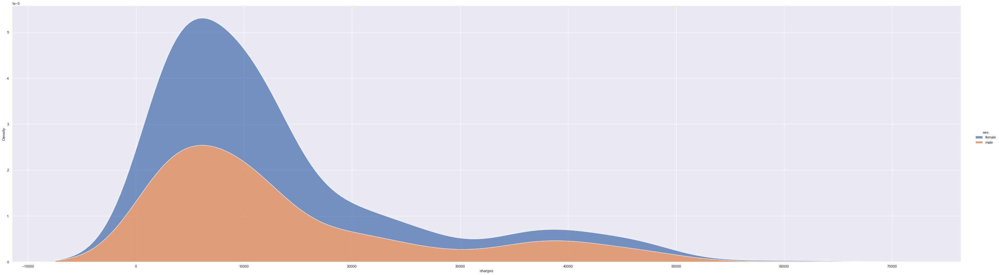

In [ ]:
# Ploting a displot of Charges vs Sex
sns.displot(
    data=df,
    x="charges",
    hue="sex",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for Charges vs Sex
import plotly.express as px

fig = px.sunburst(
    df,
    path=["sex"],
    values="charges",
    color="charges",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<AxesSubplot:xlabel='sex', ylabel='charges'>

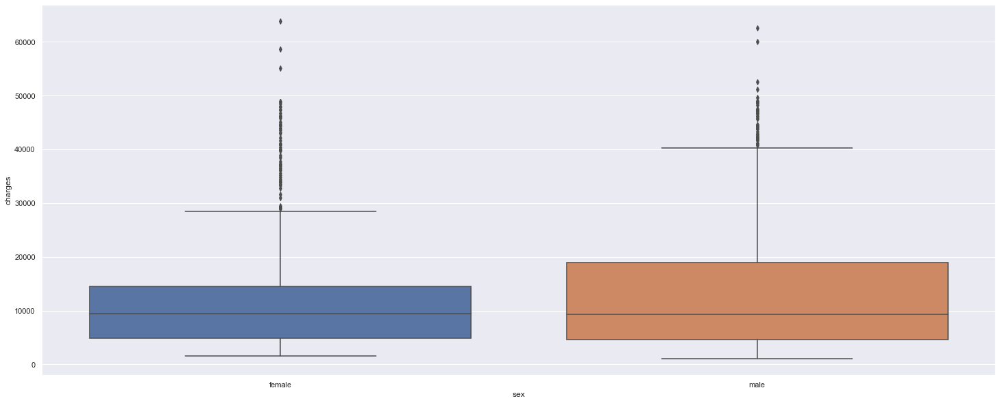

In [ ]:
# Boxplot of Charges vs Sex
plt.figure(figsize=(25, 10))
sns.boxplot(data=df, x="sex", y="charges")

In [ ]:
# Creating summary statitics pivot taable for BMI vs Diabetes Outcome
charges_sex = df.pivot_table(
    index=["sex"],
    values=["charges"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(charges_sex)

            charges                                                     \
                max          mean      median        min           std   
sex                                                                      
female  63770.42801  12569.578844  9412.96250  1607.5101  11128.703801   
male    62592.87309  13956.751178  9369.61575  1121.8739  12971.025915   

                      
                 var  
sex                   
female  1.238480e+08  
male    1.682475e+08  


In [ ]:
# comparing Charges vs Sex
data.groupby(['sex'])['charges'].describe()

,count,mean,std,min,25%,50%,75%,max
sex,,,,,,,,
female,662.0,12569.578844,11128.703801,1607.5101,4885.1587,9412.96250,14454.691825,63770.42801
male,676.0,13956.751178,12971.025915,1121.8739,4619.1340,9369.61575,18989.590250,62592.87309


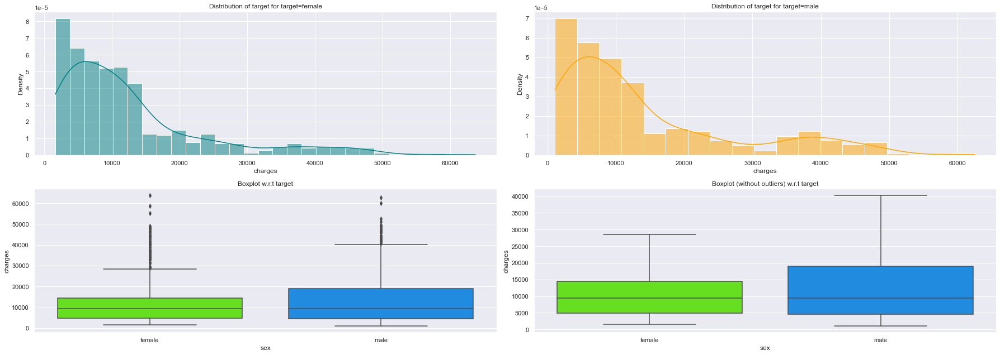

In [ ]:
# Charges vs Sex
distribution_plot_wrt_target(data, 'charges', 'sex') 

image.png

### Age in Relation to Region

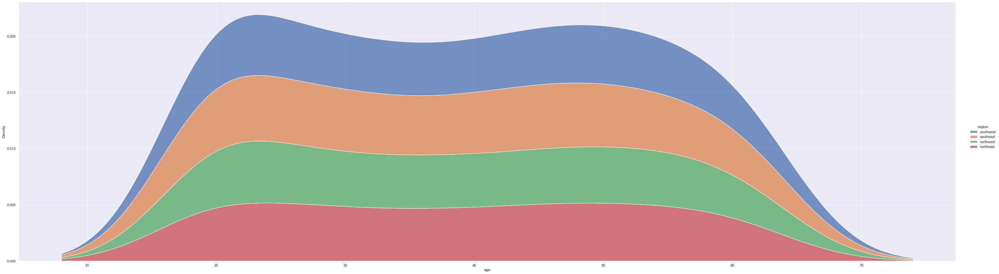

In [ ]:
# Ploting a displot of Age vs Region
sns.displot(
    data=df,
    x="age",
    hue="region",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst of Age vs Region
import plotly.express as px

fig = px.sunburst(
    df,
    path=["region"],
    values="age",
    color="age",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

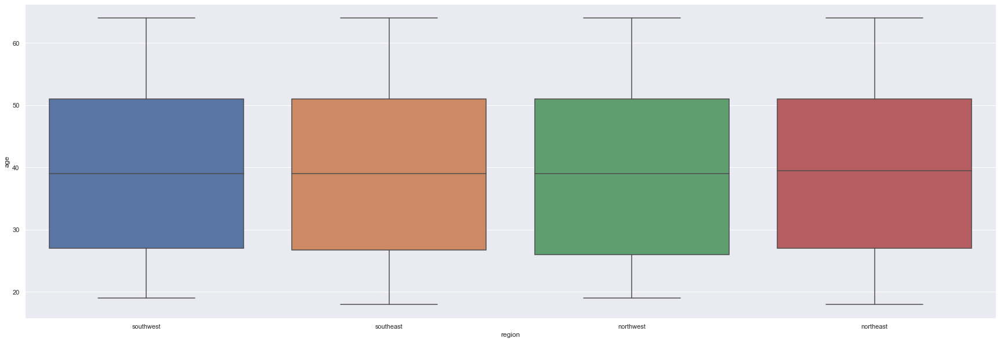

In [ ]:
# Boxplot of Age vs Region
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="region", y="age");

In [ ]:
# Creating summary statitics pivot taable for Age vs Region
age_region = df.pivot_table(
    index=["region"],
    values=["age"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(age_region)

            age                                               
            max       mean median   min        std         var
region                                                        
northeast  64.0  39.268519   39.5  18.0  14.069007  197.936963
northwest  64.0  39.196923   39.0  19.0  14.051646  197.448756
southeast  64.0  38.939560   39.0  18.0  14.164585  200.635455
southwest  64.0  39.455385   39.0  19.0  13.959886  194.878405


In [ ]:
# comparing Age vs Region
data.groupby(['region'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
northeast,324.0,39.268519,14.069007,18.0,27.00,39.5,51.0,64.0
northwest,325.0,39.196923,14.051646,19.0,26.00,39.0,51.0,64.0
southeast,364.0,38.939560,14.164585,18.0,26.75,39.0,51.0,64.0
southwest,325.0,39.455385,13.959886,19.0,27.00,39.0,51.0,64.0


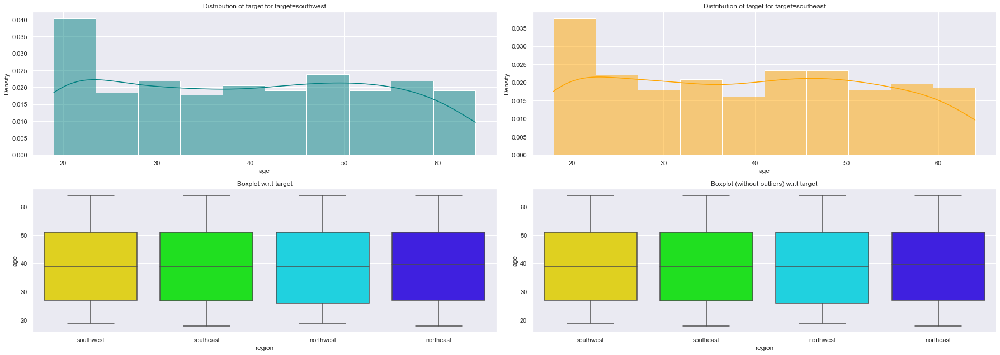

In [ ]:
# Age vs Region
distribution_plot_wrt_target(data, 'age', 'region') 

image.png

### Age in Relation to Smoker

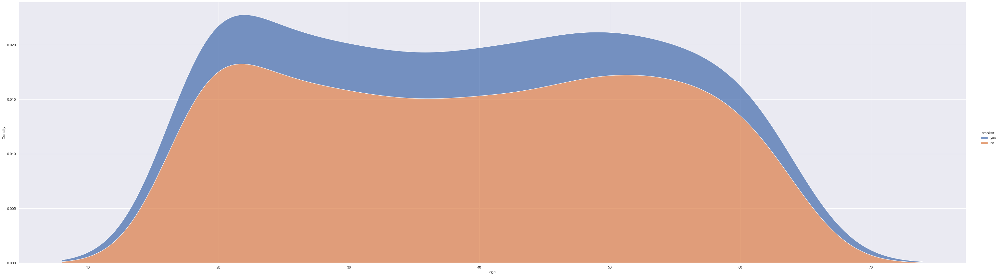

In [ ]:
# Ploting a displot of Age vs smoker
sns.displot(
    data=df,
    x="age",
    hue="smoker",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for Age vs smoker
import plotly.express as px

fig = px.sunburst(
    df,
    path=["smoker"],
    values="age",
    color="age",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

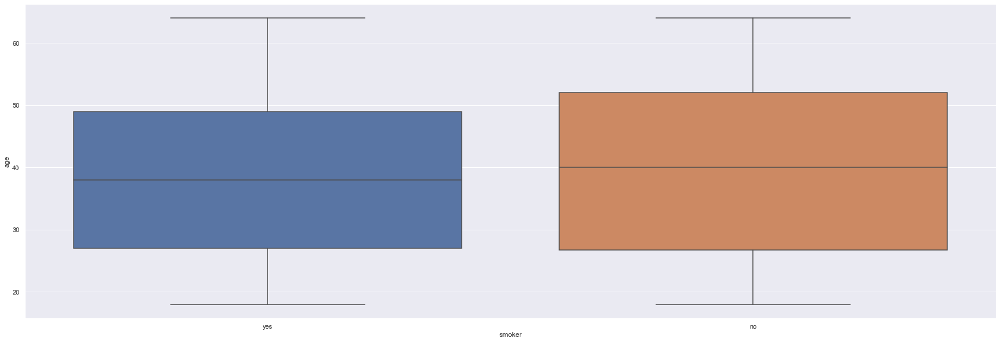

In [ ]:
# Boxplot of Age vs smoker
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="smoker", y="age");

In [ ]:

# Creating summary statitics pivot table for Age vs smoker
Age_smoker = df.pivot_table(
    index=["smoker"],
    values=["age"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Age_smoker)

         age                                               
         max       mean median   min        std         var
smoker                                                     
no      64.0  39.385338   40.0  18.0  14.083410  198.342438
yes     64.0  38.514599   38.0  18.0  13.923186  193.855097


In [ ]:
# comparing Age vs smoker
data.groupby(['smoker'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,1064.0,39.385338,14.083410,18.0,26.75,40.0,52.0,64.0
yes,274.0,38.514599,13.923186,18.0,27.00,38.0,49.0,64.0


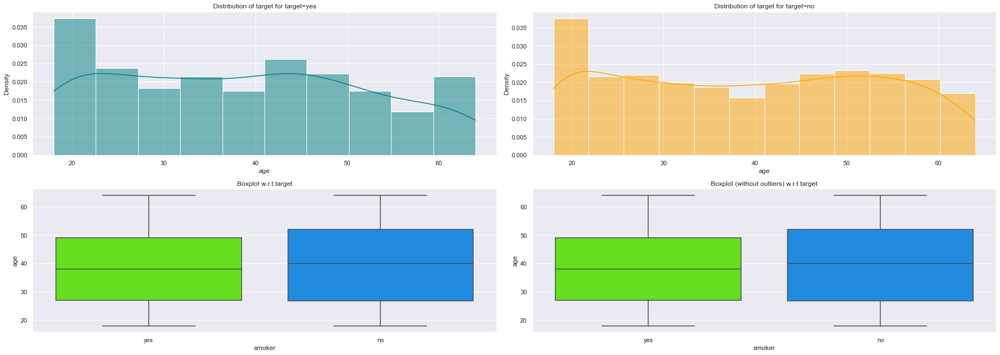

In [ ]:
# Age vs smoker
distribution_plot_wrt_target(data, 'age', 'smoker') 

image.png

### Age in Relation to Sex

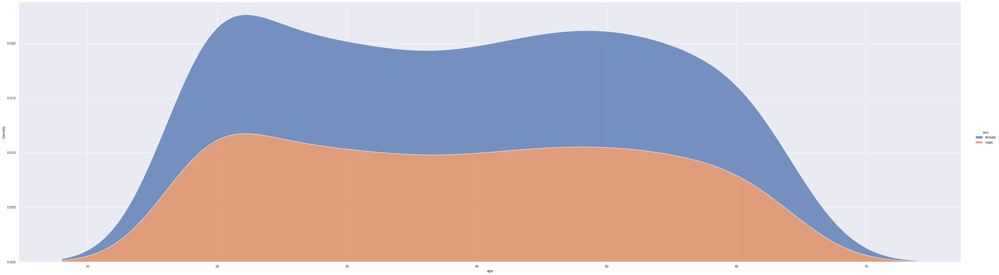

In [ ]:
# Ploting a displot of Age vs Sex
sns.displot(
    data=df,
    x="age",
    hue="sex",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for  Age vs Sex
import plotly.express as px

fig = px.sunburst(
    df,
    path=["sex"],
    values="age",
    color="age",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

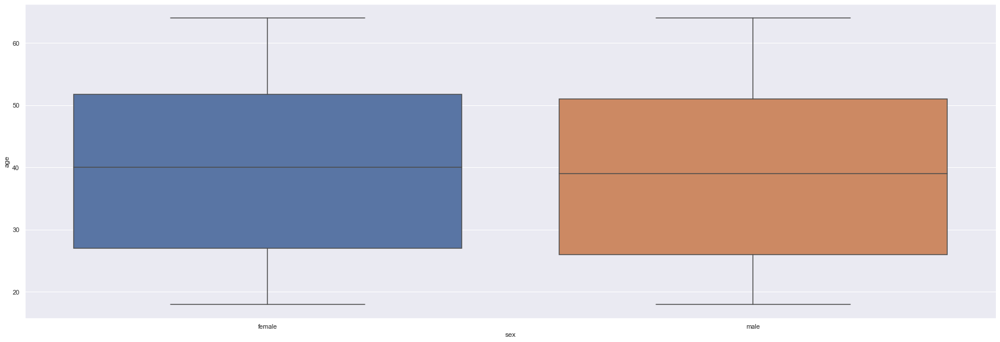

In [ ]:
# Boxplot of Age vs sex
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="sex", y="age");

In [ ]:

# Creating summary statitics pivot table for Age vs sex
Age_sex = df.pivot_table(
    index=["sex"],
    values=["age"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Age_sex)

         age                                               
         max       mean median   min        std         var
sex                                                        
female  64.0  39.503021   40.0  18.0  14.054223  197.521171
male    64.0  38.917160   39.0  18.0  14.050141  197.406461


In [ ]:
# comparing Age vs sex
data.groupby(['sex'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
sex,,,,,,,,
female,662.0,39.503021,14.054223,18.0,27.0,40.0,51.75,64.0
male,676.0,38.917160,14.050141,18.0,26.0,39.0,51.00,64.0


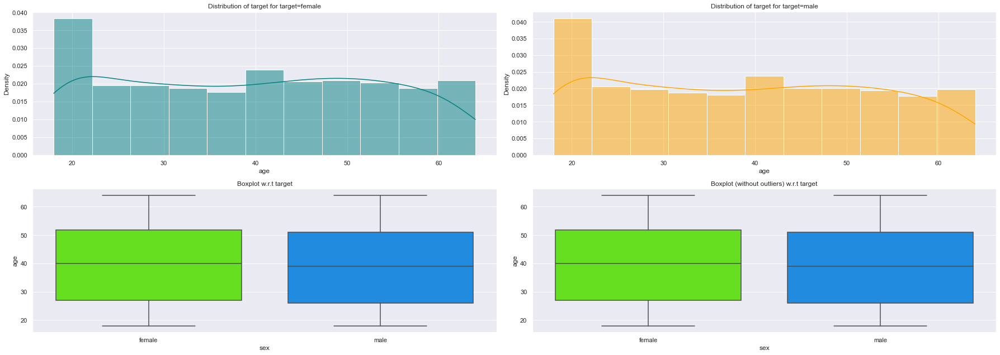

In [ ]:
# Age vs sex
distribution_plot_wrt_target(data, 'age', 'sex') 

image.png

### Number of Children in Relation to Region

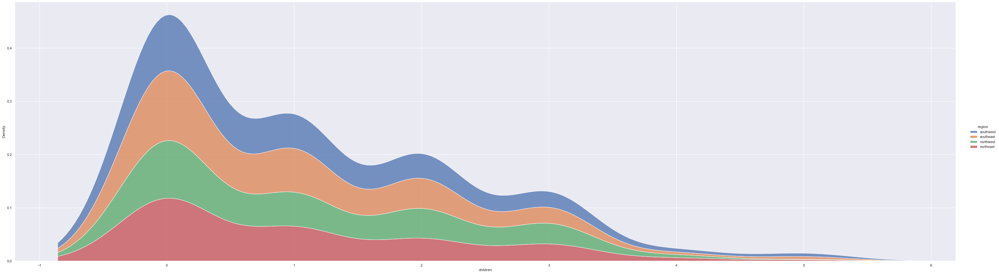

In [ ]:
# Ploting a displot of Children vs Region
sns.displot(
    data=df,
    x="children",
    hue="region",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for  Children vs Region
import plotly.express as px

fig = px.sunburst(
    df,
    path=["region"],
    values="children",
    color="children",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

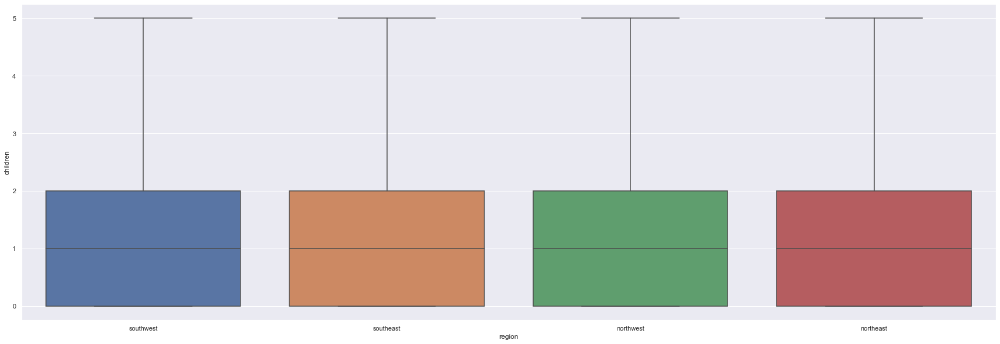

In [ ]:
# Boxplot of Children vs Region
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="region", y="children");

In [ ]:

# Creating summary statitics pivot table for Children vs Region
Child_reg = df.pivot_table(
    index=["region"],
    values=["children"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Child_reg)

          children                                          
               max      mean median  min       std       var
region                                                      
northeast      5.0  1.046296    1.0  0.0  1.198949  1.437479
northwest      5.0  1.147692    1.0  0.0  1.171828  1.373181
southeast      5.0  1.049451    1.0  0.0  1.177276  1.385978
southwest      5.0  1.141538    1.0  0.0  1.275952  1.628053


In [ ]:
# comparing Children vs Region
data.groupby(['region'])['children'].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
northeast,324.0,1.046296,1.198949,0.0,0.0,1.0,2.0,5.0
northwest,325.0,1.147692,1.171828,0.0,0.0,1.0,2.0,5.0
southeast,364.0,1.049451,1.177276,0.0,0.0,1.0,2.0,5.0
southwest,325.0,1.141538,1.275952,0.0,0.0,1.0,2.0,5.0


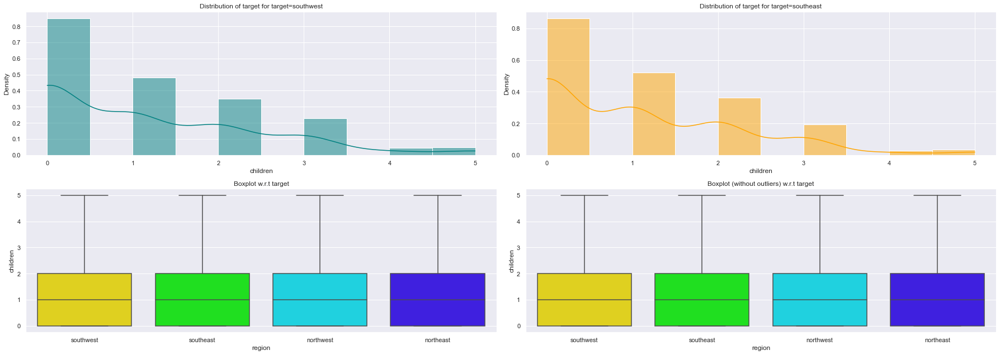

In [ ]:
# Children vs Region
distribution_plot_wrt_target(data, 'children', 'region') 

image.png

### Number of Children in Relation to smoker

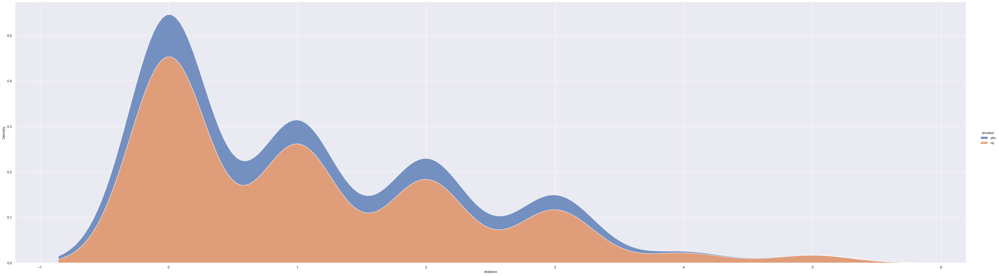

In [ ]:
# Ploting a displot of Children vs Smoker
sns.displot(
    data=df,
    x="children",
    hue="smoker",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for  Children vs Smoker
import plotly.express as px

fig = px.sunburst(
    df,
    path=["smoker"],
    values="children",
    color="children",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

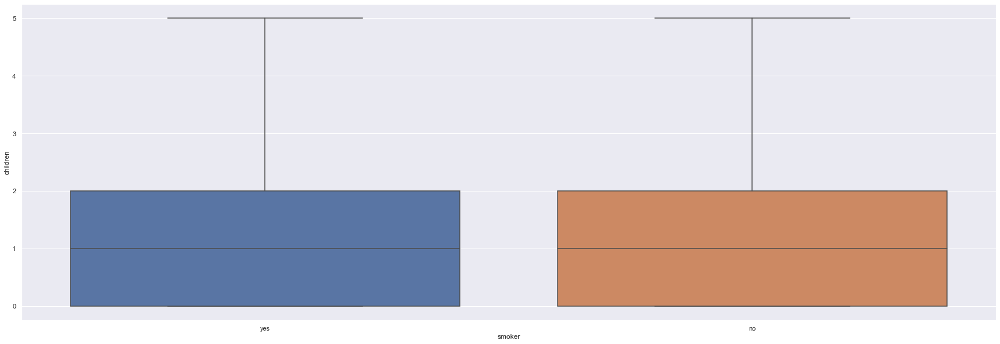

In [ ]:
# Boxplot of Children vs Smoker
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="smoker", y="children");

In [ ]:

# Creating summary statitics pivot table for Children vs Smoker
Child_smoker = df.pivot_table(
    index=["smoker"],
    values=["children"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Child_smoker)

       children                                          
            max      mean median  min       std       var
smoker                                                   
no          5.0  1.090226    1.0  0.0  1.218136  1.483855
yes         5.0  1.113139    1.0  0.0  1.157066  1.338801


In [ ]:
# comparing Children vs Smoker
data.groupby(['smoker'])['children'].describe()

,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,1064.0,1.090226,1.218136,0.0,0.0,1.0,2.0,5.0
yes,274.0,1.113139,1.157066,0.0,0.0,1.0,2.0,5.0


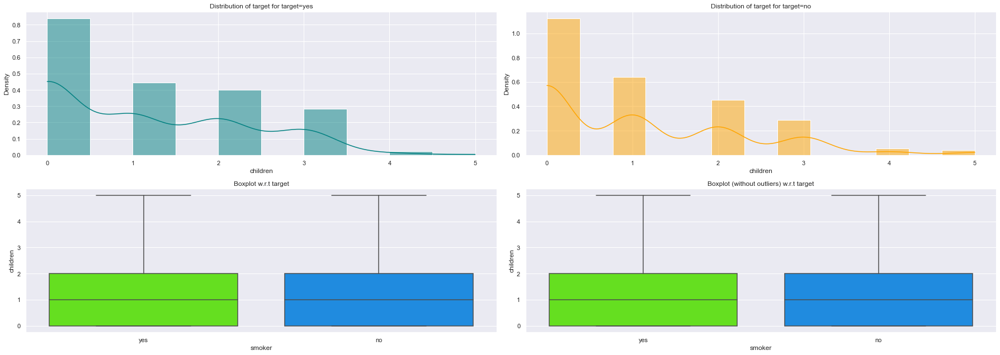

In [ ]:
# Children vs Smoker
distribution_plot_wrt_target(data, 'children', 'smoker') 

image.png

### Number of Children in Relation to Sex

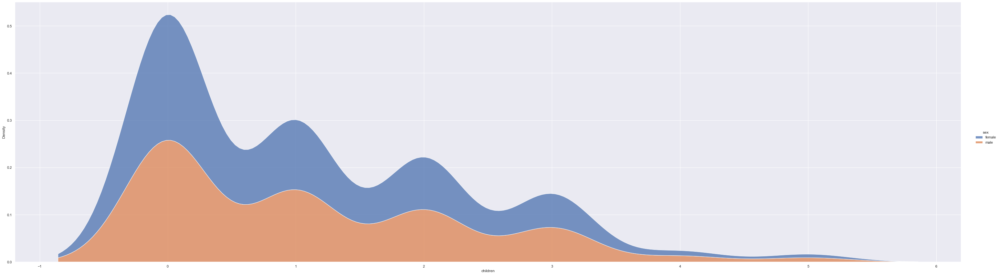

In [ ]:
# Ploting a displot of Children vs Sex
sns.displot(
    data=df,
    x="children",
    hue="sex",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
);

In [ ]:
# Creating a sunburst chart for  Children vs Sex
import plotly.express as px

fig = px.sunburst(
    df,
    path=["sex"],
    values="children",
    color="children",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

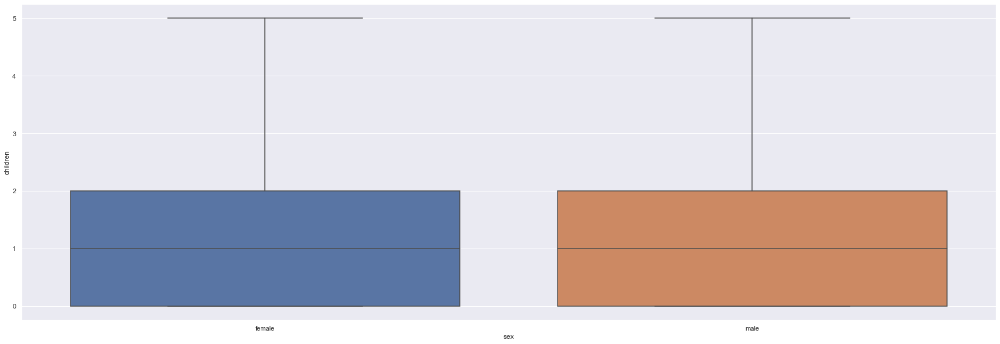

In [ ]:
# Boxplot of Children vs Sex
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="sex", y="children");

In [ ]:

# Creating summary statitics pivot table for Children vs Sex
Child_sex = df.pivot_table(
    index=["sex"],
    values=["children"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Child_sex)

       children                                          
            max      mean median  min       std       var
sex                                                      
female      5.0  1.074018    1.0  0.0  1.192115  1.421139
male        5.0  1.115385    1.0  0.0  1.218986  1.485926


In [ ]:
# comparing Children vs Sex
data.groupby(['sex'])['children'].describe()

,count,mean,std,min,25%,50%,75%,max
sex,,,,,,,,
female,662.0,1.074018,1.192115,0.0,0.0,1.0,2.0,5.0
male,676.0,1.115385,1.218986,0.0,0.0,1.0,2.0,5.0


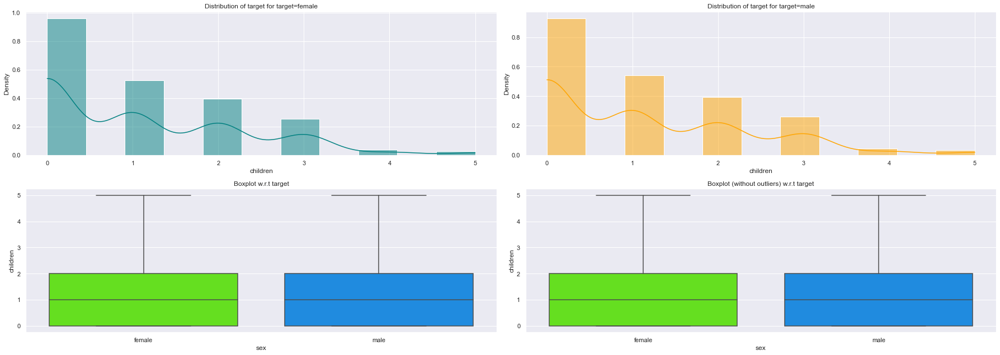

In [ ]:
# Children vs Sex
distribution_plot_wrt_target(data, 'children', 'sex') 

image.png

image.png

## Correlation and Pairplot Analysis

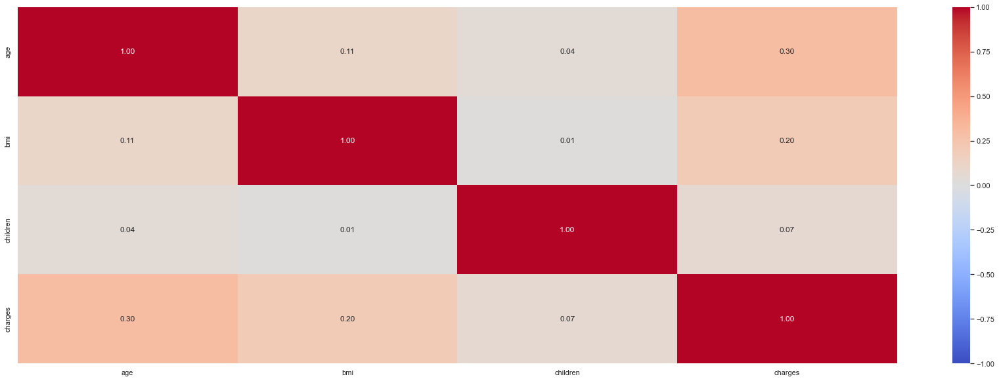

In [ ]:
# Displaying the correlation between numerical variables of the dataset
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.show()

image.png

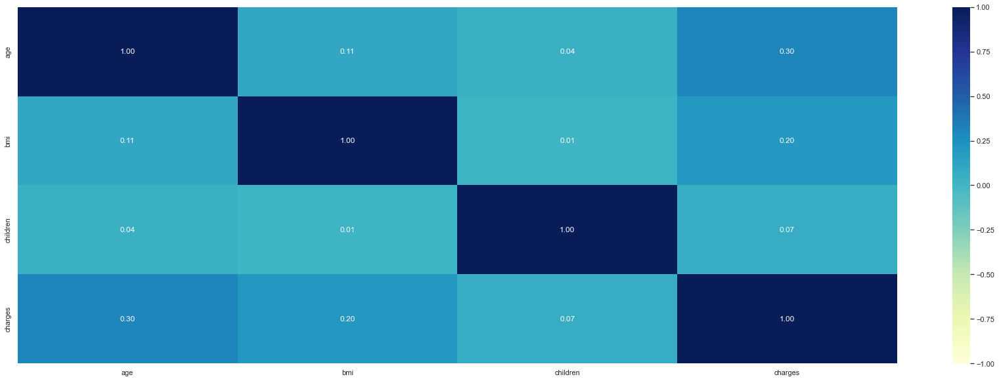

In [ ]:
# creates heatmap showing correlation of numeric columns in data
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="YlGnBu", annot=True, fmt=".2f");

image.png

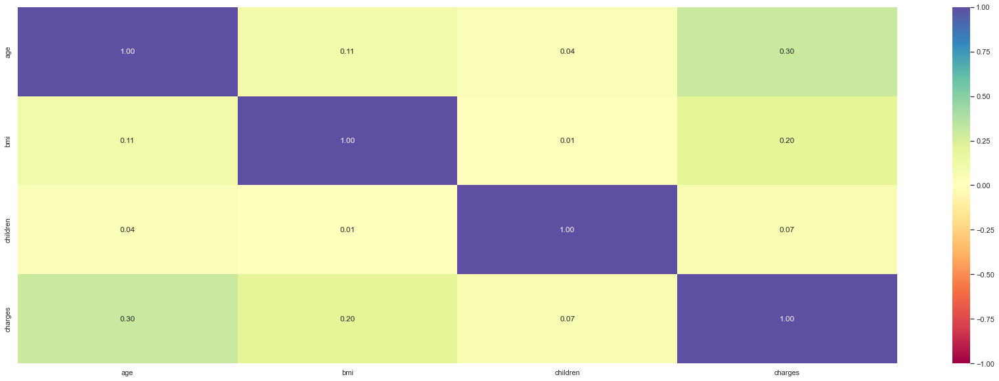

In [ ]:
cols_list = data.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(30, 10))
sns.heatmap(
    data[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
) ## Complete the code to find the correlation between the variables
plt.show()

image.png

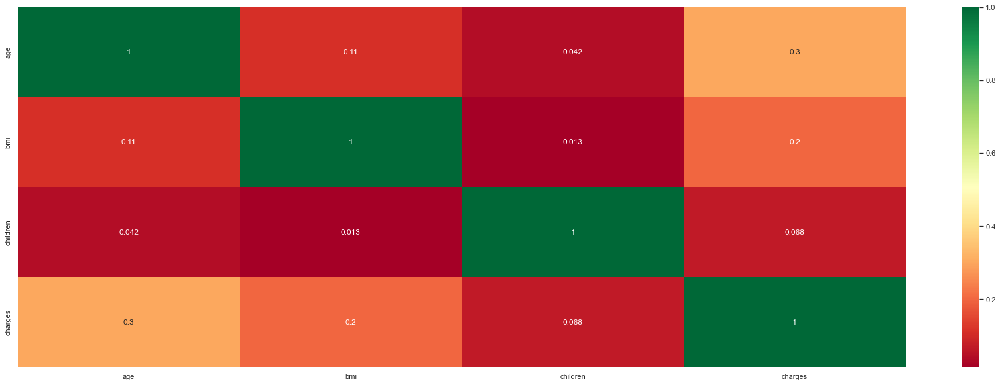

In [ ]:
# using heatmap
correlation = data.corr() # creating a 2-D Matrix with correlation plots
plt.figure(figsize=(30,10))
sns.heatmap(correlation, annot=True, cmap="RdYlGn");

image.png

In [ ]:
data.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

image.png

In [ ]:
# correlation betweon one column and the rest
df.corr()['charges']

age         0.299008
bmi         0.198341
children    0.067998
charges     1.000000
Name: charges, dtype: float64

image.png

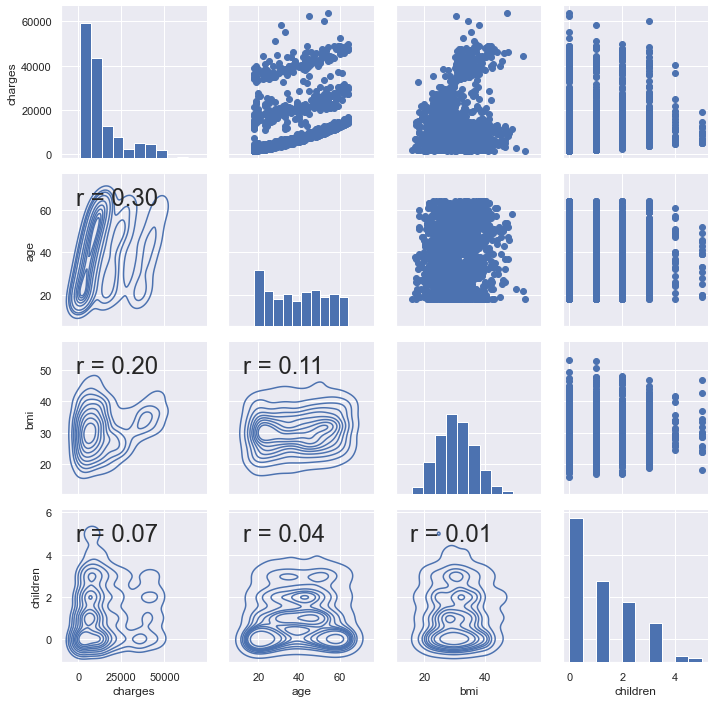

In [ ]:
import scipy

# Function to calculate correlation coefficient between two variables
def corrfunc(x, y, **kwgs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .8), xycoords=ax.transAxes,
               size = 24)

# Create a PairGrid
g = sns.PairGrid(data = df,  
                 vars = ['charges', 'age', 'bmi', 'children'])

# Map a scatterplot to the upper triangle
g.map_upper(plt.scatter)

# Map a histogram to the diagonal
g.map_diag(plt.hist)

# Map a kde plot to the lower triangle
g.map_lower(sns.kdeplot)

# Map the correlation coefficient to the lower diagonal
g.map_lower(corrfunc)

image.png

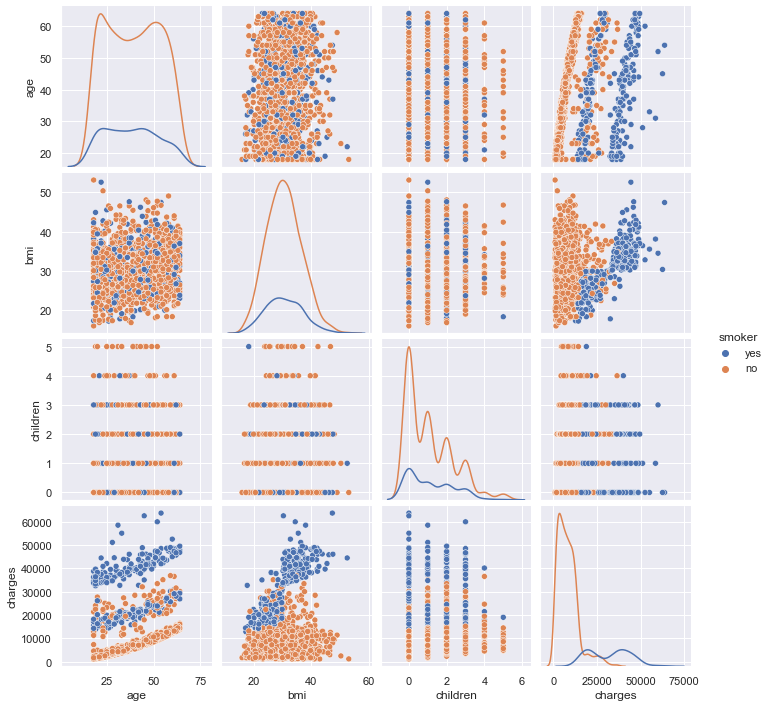

In [ ]:
import seaborn as sns

sns.pairplot(df , hue='smoker' , diag_kind = 'kde',diag_kws=dict(fill=False))
plt.show()

image.png

## Data Preprocessing

### Outlier Detection and Treatment

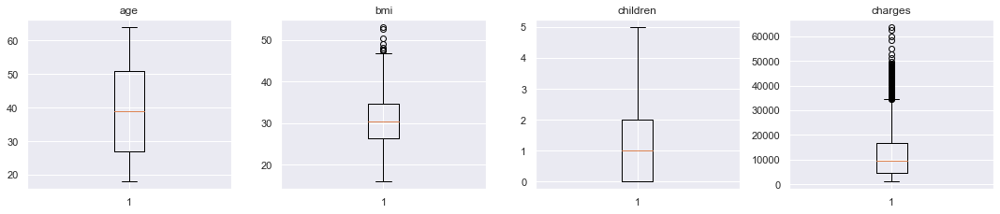

In [ ]:
# outlier detection using boxplot
numeric_columns = data.select_dtypes(include=np.number).columns.tolist()


plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(data[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

- There are quite a few outliers in the data.
- However, we will not treat them as they are proper values.

In [ ]:
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### Data Preparataion for model building

In [ ]:
# Separating features and the target column
X = data.drop('charges', axis=1)
y = data['charges']



X = pd.get_dummies(X,  columns=X.select_dtypes(include=["object", "category"]).columns.tolist(),
    drop_first=True,
)
X.head()  ## Complete the code to create dummies 


,age,bmi,children,sex_male,smoker_yes,region_northwest,region_southeast,region_southwest
0,19,27.900,0,0,1,0,0,1
1,18,33.770,1,1,0,0,1,0
2,28,33.000,3,1,0,0,1,0
3,33,22.705,0,1,0,1,0,0
4,32,28.880,0,1,0,1,0,0


In [ ]:
# Splitting the data into train and test sets in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1, shuffle=True)

In [ ]:
X_train.shape, X_test.shape

((936, 8), (402, 8))

In [ ]:
y.head()

0    16884.92400
1     1725.55230
2     4449.46200
3    21984.47061
4     3866.85520
Name: charges, dtype: float64

## Bagging - Model Building and Hyperparameter Tuning

- We'll fit different models on the train data and observe their performance. 
- We'll try to improve that performance by tuning some hyperparameters available for that algorithm.
- We'll use GridSearchCv for hyperparameter tuning and `r_2 score` to optimize the model.
- R-square - `Coefficient of determination` is used to evaluate the performance of a regression model. It is the amount of the variation in the output dependent attribute which is predictable from the input independent variables.
- Let's start by creating a function to get model scores, so that we don't have to use the same codes repeatedly.

In [ ]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

In [ ]:
##  Function to calculate r2_score and RMSE on train and test data
def get_model_score(model, flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_r2=metrics.r2_score(y_train,pred_train)
    test_r2=metrics.r2_score(y_test,pred_test)
    train_rmse=np.sqrt(metrics.mean_squared_error(y_train,pred_train))
    test_rmse=np.sqrt(metrics.mean_squared_error(y_test,pred_test))
    
    #Adding all scores in the list
    score_list.extend((train_r2,test_r2,train_rmse,test_rmse))
    
    # If the flag is set to True then only the following print statements will be dispayed, the default value is True
    if flag==True: 
        print("R-sqaure on training set : ",metrics.r2_score(y_train,pred_train))
        print("R-square on test set : ",metrics.r2_score(y_test,pred_test))
        print("RMSE on training set : ",np.sqrt(metrics.mean_squared_error(y_train,pred_train)))
        print("RMSE on test set : ",np.sqrt(metrics.mean_squared_error(y_test,pred_test)))
    
    # returning the list with train and test scores
    return score_list

### Decision Tree Model

In [ ]:
dtree=DecisionTreeRegressor(random_state=1)
dtree.fit(X_train,y_train)

DecisionTreeRegressor(random_state=1)

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [ ]:
dtree_model_train_perf=model_performance_regression(dtree, X_train,y_train)
print("Training performance \n",dtree_model_train_perf)

Training performance 
    RMSE  MAE  R-squared  Adj. R-squared  MAPE
0   0.0  0.0        1.0             1.0   0.0


In [ ]:
dtree_model_test_perf=model_performance_regression(dtree, X_test,y_test)
print("Testing performance \n",dtree_model_test_perf)

Testing performance 
           RMSE        MAE  R-squared  Adj. R-squared       MAPE
0  6552.935061  3126.1233   0.696994        0.690826  36.211025


- The Decision tree model with default parameters is overfitting the train data.
- Let's see if we can reduce overfitting and improve performance on test data by tuning hyperparameters.

### Hyperparameter Tuning

In [ ]:
# Choose the type of classifier. 
dtree_tuned = DecisionTreeRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': list(np.arange(2,20)) + [None], 
              'min_samples_leaf': [1, 3, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10, 15] + [None],
              'min_impurity_decrease': [0.001, 0.01, 0.1, 0.0]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_tuned.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=4, max_leaf_nodes=15,
                      min_impurity_decrease=0.001, min_samples_leaf=10,
                      random_state=1)

In [ ]:
dtree_tuned_model_train_perf = model_performance_regression(dtree_tuned, X_train,y_train)
print("Training performance \n",dtree_tuned_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4424.516926  2563.840942   0.868275        0.867138  31.244158


In [ ]:
dtree_tuned_model_test_perf = model_performance_regression(dtree_tuned, X_test,y_test)
print("Testing performance \n",dtree_tuned_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4575.947376  2574.906191   0.852245        0.849238  30.527671


- The overfitting is reduced after hyperparameter tuning and the test score has increased by approx 2%.
- RMSE is also reduced on test data and the model is generalizing better than the decision tree model with default parameters.

**Plotting the feature importance of each variable**

In [ ]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(dtree_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                       Imp
smoker_yes        0.729986
bmi               0.158917
age               0.106619
children          0.004478
sex_male          0.000000
region_northwest  0.000000
region_southeast  0.000000
region_southwest  0.000000


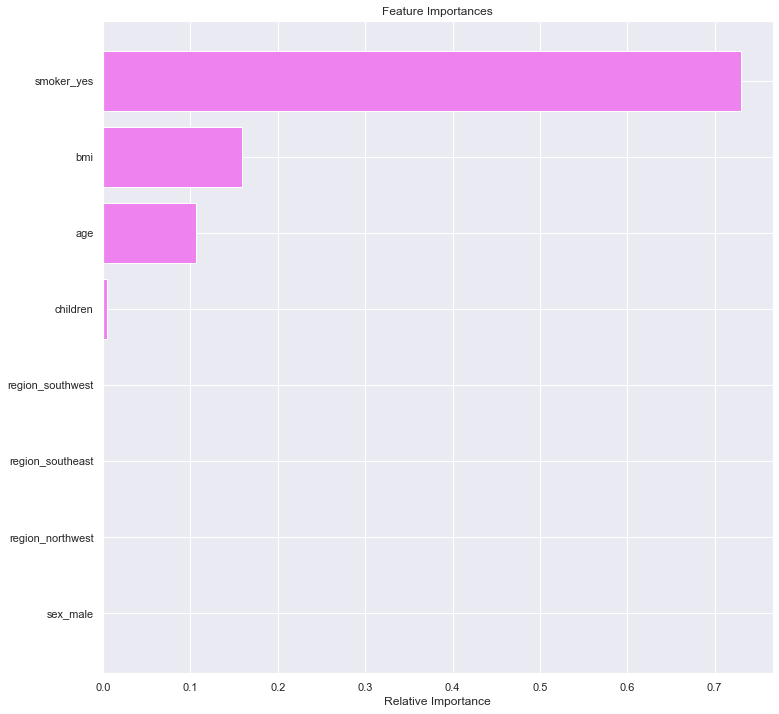

In [ ]:
feature_names = X_train.columns
importances = dtree_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- hr is the most important feature, in addition to temp and yr, for tuned decision tree model

### Random Forest Model

In [ ]:
rf_estimator=RandomForestRegressor(random_state=1)
rf_estimator.fit(X_train,y_train)

RandomForestRegressor(random_state=1)

In [ ]:
rf_estimator_model_train_perf = model_performance_regression(rf_estimator, X_train,y_train)
print("Training performance \n",rf_estimator_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  1883.056551  1051.740727    0.97614        0.975935  13.031236


In [ ]:
rf_estimator_model_test_perf = model_performance_regression(rf_estimator, X_test,y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4928.605414  2801.110497   0.828594        0.825104  33.403338


- Random forest is giving a good r2 score of 94% on the test data but it is slightly overfitting the train data.
- Let's try to reduce this overfitting by hyperparameter tuning.

### Hyperparameter Tuning

In [ ]:
# Choose the type of classifier. 
rf_tuned = RandomForestRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {  
                'max_depth':[4, 6, 8, 10, None],
                'max_features': ['sqrt','log2',None],
                'n_estimators': [80, 90, 100, 110, 120]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(rf_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rf_tuned.fit(X_train, y_train)

RandomForestRegressor(max_depth=4, max_features=None, n_estimators=120,
                      random_state=1)

In [ ]:
rf_tuned_model_train_perf = model_performance_regression(rf_tuned, X_train, y_train)
print("Training performance \n",rf_tuned_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4267.891894  2428.453898   0.877436        0.876378  30.931194


In [ ]:
rf_tuned_model_test_perf = model_performance_regression(rf_tuned, X_test, y_test)
print("Testing performance \n",rf_tuned_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4512.976949  2492.230058   0.856284        0.853358  30.755716


- No significant change in the result. The result is almost the same before or after the hyperparameter tuning.

In [ ]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(rf_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                       Imp
smoker_yes        0.724633
bmi               0.160317
age               0.107047
children          0.007396
region_southeast  0.000195
region_northwest  0.000184
sex_male          0.000164
region_southwest  0.000063


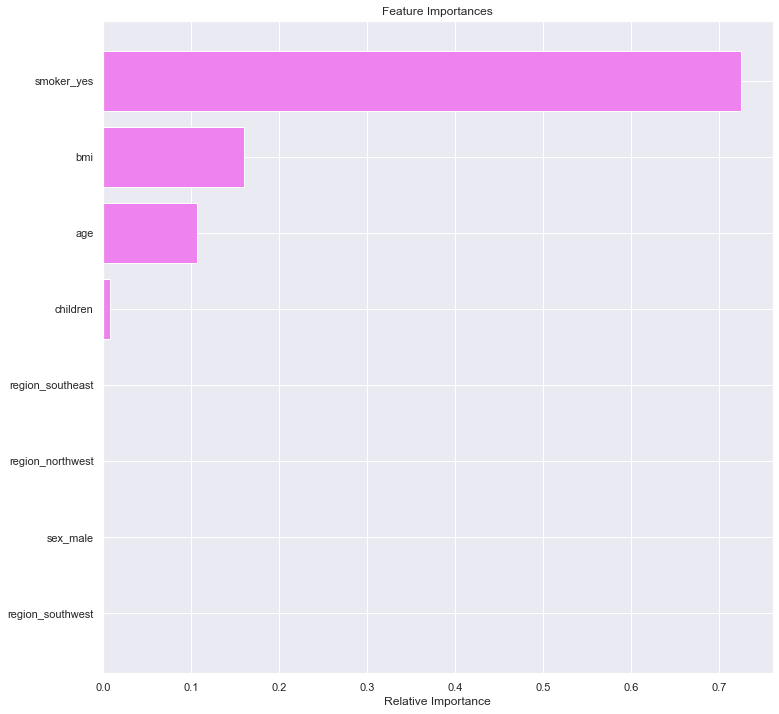

In [ ]:
feature_names = X_train.columns
importances = rf_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- hr is the most important feature, in addition to temp and yr, for the tuned random forest model.

## Boosting - Model Building and Hyperparameter Tuning

### AdaBoost Regressor

In [ ]:
ab_regressor=AdaBoostRegressor(random_state=1)
ab_regressor.fit(X_train,y_train)

AdaBoostRegressor(random_state=1)

In [ ]:
ab_regressor_model_train_perf = model_performance_regression(ab_regressor, X_train,y_train)
print("Training performance \n",ab_regressor_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4823.327249  3667.453141   0.843458        0.842107  61.908061


In [ ]:
ab_regressor_model_test_perf = model_performance_regression(ab_regressor, X_test,y_test)
print("Testing performance \n",ab_regressor_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  5041.805227  3813.516982   0.820629        0.816978  63.698328


- AdaBoost is generalizing well but it is giving poor performance, in terms of r2 score as well as RMSE, as compared to the decision tree and random forest model.  

### Hyperparameter Tuning

In [ ]:
# Choose the type of classifier. 
ab_tuned = AdaBoostRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {'n_estimators': np.arange(10,100,10), 
              'learning_rate': [1, 0.1, 0.5, 0.01],
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(ab_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
ab_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
ab_tuned.fit(X_train, y_train)

AdaBoostRegressor(learning_rate=0.01, n_estimators=40, random_state=1)

In [ ]:
ab_tuned_model_train_perf = model_performance_regression(ab_tuned, X_train,y_train)
print("Training performance \n",ab_tuned_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4530.377367  2805.837375   0.861896        0.860705  38.454285


In [ ]:
ab_tuned_model_test_perf = model_performance_regression(ab_tuned, X_test,y_test)
print("Testing performance \n",ab_tuned_model_test_perf)

Testing performance 
          RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4634.50077  2768.702279    0.84844        0.845355  38.517113


- We can see that there is no significant improvement in the model after hyperparameter tuning.

In [ ]:
# importance of features in the tree building

print(pd.DataFrame(ab_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                       Imp
smoker_yes        0.734671
bmi               0.156457
age               0.105257
children          0.003615
sex_male          0.000000
region_northwest  0.000000
region_southeast  0.000000
region_southwest  0.000000


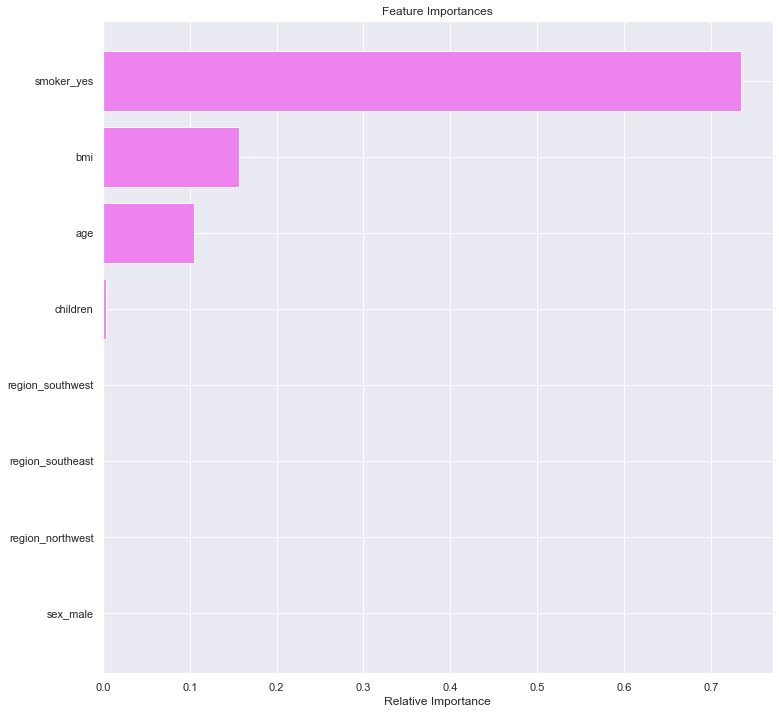

In [ ]:
feature_names = X_train.columns
importances = ab_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- hr is the most important feature here, followed by yr and atemp.

### Gradient Boosting Regressor

In [ ]:
gb_estimator=GradientBoostingRegressor(random_state=1)
gb_estimator.fit(X_train,y_train)

GradientBoostingRegressor(random_state=1)

In [ ]:
gb_estimator_model_train_perf = model_performance_regression(gb_estimator, X_train,y_train)
print("Training performance \n",gb_estimator_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  3734.365029  2054.952053   0.906164        0.905354  25.576065


In [ ]:
gb_estimator_model_test_perf = model_performance_regression(gb_estimator, X_test, y_test)
print("Testing performance \n",gb_estimator_model_test_perf)

Testing performance 
          RMSE          MAE  R-squared  Adj. R-squared      MAPE
0  4496.06822  2481.420389   0.857359        0.854455  29.40346


- Gradient boosting is generalizing well and giving decent results but not as good as random forest.

### Hyperparameter Tuning

In [ ]:
# Choose the type of classifier. 
gb_tuned = GradientBoostingRegressor(random_state=1)

# Grid of parameters to choose from
parameters = {'n_estimators': np.arange(50,200,25), 
              'subsample':[0.7,0.8,0.9,1],
              'max_features':[0.7,0.8,0.9,1],
              'max_depth':[3,5,7,10]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(gb_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
gb_tuned.fit(X_train, y_train)

GradientBoostingRegressor(max_features=0.8, n_estimators=50, random_state=1,
                          subsample=1)

In [ ]:
gb_tuned_model_train_perf = model_performance_regression(gb_tuned, X_train,y_train)
print("Training performance \n",gb_tuned_model_train_perf)

Training performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4111.338582  2309.011179   0.886263        0.885281  30.148772


In [ ]:
gb_tuned_model_test_perf = model_performance_regression(gb_tuned, X_test, y_test)
print("Testing performance \n",gb_tuned_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  4441.722267  2463.022505   0.860786        0.857952  30.820256


- We can see that the model has improved significantly in terms of r2 score and RMSE.
- The r2 score has increased by approx 12% on the test data.
- RMSE has decreased by more than 30 for the test data.

In [ ]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(gb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                       Imp
smoker_yes        0.719894
bmi               0.153856
age               0.115253
children          0.008707
region_northwest  0.000835
sex_male          0.000607
region_southwest  0.000538
region_southeast  0.000310


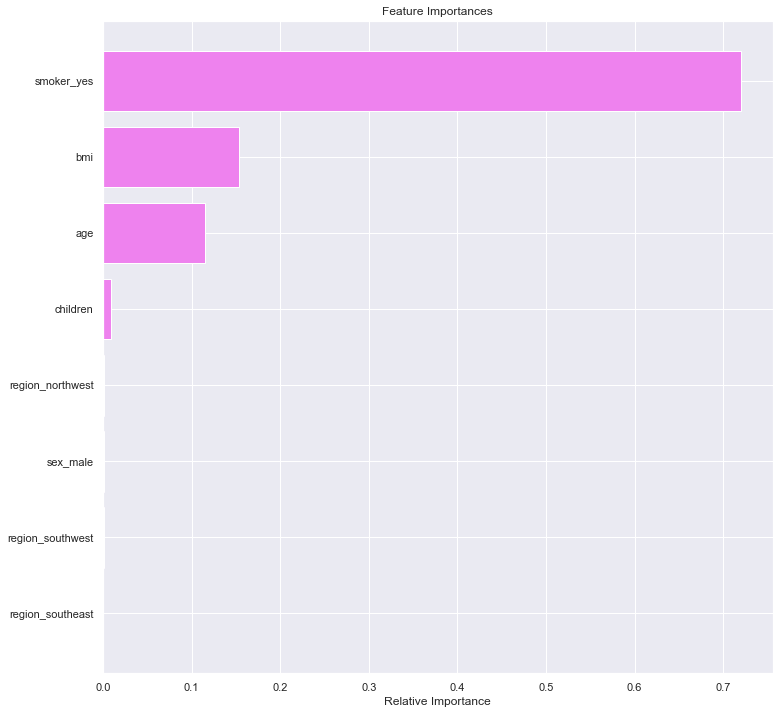

In [ ]:
feature_names = X_train.columns
importances = gb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- hr is the most important feature
- temp, yr and workingday have almost equal importance 

### XGBoost Regressor

In [ ]:
xgb_estimator=XGBRegressor(random_state=1, verbosity = 0)
xgb_estimator.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=1, ...)

In [ ]:
xgb_estimator_model_train_perf = model_performance_regression(xgb_estimator, X_train, y_train)
print("Training performance \n",xgb_estimator_model_train_perf)

Training performance 
         RMSE         MAE  R-squared  Adj. R-squared      MAPE
0  704.30054  416.407284   0.996662        0.996633  5.838824


In [ ]:
xgb_estimator_model_test_perf = model_performance_regression(xgb_estimator, X_test,y_test)
print("Testing performance \n",xgb_estimator_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  5095.029528  2905.879545   0.816822        0.813094  37.670149


- XGBoost with default parameters is giving almost as good results as the tuned gradient boosting model.

### Hyperparameter Tuning

In [ ]:
# Choose the type of classifier. 
xgb_tuned = XGBRegressor(random_state=1, verbosity = 0)

# Grid of parameters to choose from
parameters = {'n_estimators': [75,100,125,150], 
              'subsample':[0.7, 0.8, 0.9, 1],
              'gamma':[0, 1, 3, 5],
              'colsample_bytree':[0.7, 0.8, 0.9, 1],
              'colsample_bylevel':[0.7, 0.8, 0.9, 1]
              }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
xgb_tuned.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=1, colsample_bytree=0.9,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=75, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=1, ...)

In [ ]:
xgb_tuned_model_train_perf = model_performance_regression(xgb_tuned, X_train, y_train)
print("Training performance \n",xgb_tuned_model_train_perf)

Training performance 
           RMSE         MAE  R-squared  Adj. R-squared       MAPE
0  1216.787536  731.513653   0.990038        0.989952  10.684835


In [ ]:
xgb_tuned_model_test_perf = model_performance_regression(xgb_tuned, X_test, y_test)
print("Testing performance \n",xgb_tuned_model_test_perf)

Testing performance 
          RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  5174.31062  3075.994602   0.811077        0.807232  40.450388


In [ ]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(xgb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                       Imp
smoker_yes        0.926460
age               0.022242
bmi               0.021028
region_northwest  0.006797
children          0.006268
region_southeast  0.006264
sex_male          0.005919
region_southwest  0.005022


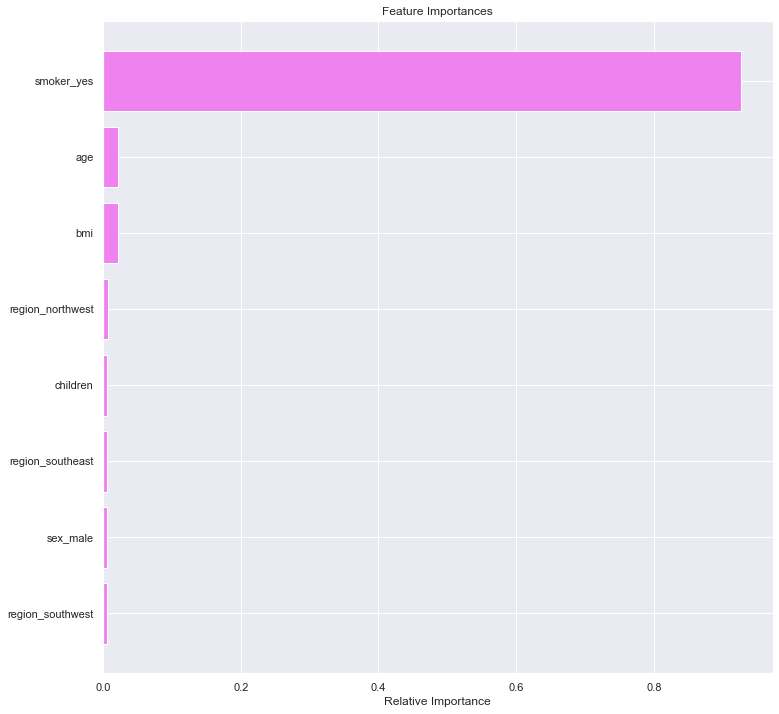

In [ ]:
feature_names = X_train.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

- In XGBoost, workingday is the most important feature followed by features - hr and yr

## Stacking Model

**Now, let's build a stacking model with the tuned models - decision tree, random forest, and gradient boosting, then use XGBoost to get the final prediction.**

In [ ]:
estimators=[('Decision Tree', dtree_tuned),('Random Forest', rf_tuned),
           ('Gradient Boosting', gb_tuned)]
final_estimator=XGBRegressor(random_state=1)

In [ ]:
stacking_estimator=StackingRegressor(estimators=estimators, final_estimator=final_estimator,cv=5)
stacking_estimator.fit(X_train,y_train)

StackingRegressor(cv=5,
                  estimators=[('Decision Tree',
                               DecisionTreeRegressor(max_depth=4,
                                                     max_leaf_nodes=15,
                                                     min_impurity_decrease=0.001,
                                                     min_samples_leaf=10,
                                                     random_state=1)),
                              ('Random Forest',
                               RandomForestRegressor(max_depth=4,
                                                     max_features=None,
                                                     n_estimators=120,
                                                     random_state=1)),
                              ('Gradient Boosting',
                               GradientBoostingRegressor(max_features=0.8,
                                                         n_estimators=50,
                                                         r...
                                               gpu_id=None, grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=None, max_bin=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=None, max_leaves=None,
                                               min_child_weight=None,
                                               missing=nan,
                                               monotone_constraints=None,
                                               n_estimators=100, n_jobs=None,
                                               num_parallel_tree=None,
                                               predictor=None, random_state=1,
                                               reg_alpha=None, reg_lambda=None, ...))

In [ ]:
stacking_estimator_model_train_perf = model_performance_regression(stacking_estimator, X_train, y_train)
print("Training performance \n",stacking_estimator_model_train_perf)

Training performance 
           RMSE         MAE  R-squared  Adj. R-squared       MAPE
0  4932.568761  2714.85011   0.836287        0.834874  31.640557


In [ ]:
stacking_estimator_model_test_perf = model_performance_regression(stacking_estimator, X_test, y_test)
print("Testing performance \n",stacking_estimator_model_test_perf)

Testing performance 
           RMSE          MAE  R-squared  Adj. R-squared       MAPE
0  5199.363611  2744.985882   0.809243         0.80536  28.680015


## Comparing all models

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [dtree_model_train_perf.T, dtree_tuned_model_train_perf.T, rf_estimator_model_train_perf.T,rf_tuned_model_train_perf.T,
    ab_regressor_model_train_perf.T,ab_tuned_model_train_perf.T,gb_estimator_model_train_perf.T,gb_tuned_model_train_perf.T,
    xgb_estimator_model_train_perf.T,xgb_tuned_model_train_perf.T,stacking_estimator_model_train_perf.T],
    axis=1,
)

models_train_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Adaboost Regressor",
    "Adaboost Tuned",
    "Gradient Boost Estimator",
    "Gradient Boost Tuned",
    "XGB",
    "XGB Tuned",
    "Stacking Classifier"
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest Estimator,Random Forest Tuned,Adaboost Regressor,Adaboost Tuned,Gradient Boost Estimator,Gradient Boost Tuned,XGB,XGB Tuned,Stacking Classifier
RMSE,0.0,4424.516926,1883.056551,4267.891894,4823.327249,4530.377367,3734.365029,4111.338582,704.300540,1216.787536,4932.568761
MAE,0.0,2563.840942,1051.740727,2428.453898,3667.453141,2805.837375,2054.952053,2309.011179,416.407284,731.513653,2714.850110
R-squared,1.0,0.868275,0.976140,0.877436,0.843458,0.861896,0.906164,0.886263,0.996662,0.990038,0.836287
Adj. R-squared,1.0,0.867138,0.975935,0.876378,0.842107,0.860705,0.905354,0.885281,0.996633,0.989952,0.834874
MAPE,0.0,31.244158,13.031236,30.931194,61.908061,38.454285,25.576065,30.148772,5.838824,10.684835,31.640557


In [ ]:
# Testing performance comparison

models_test_comp_df = pd.concat(
    [dtree_model_test_perf.T, dtree_tuned_model_test_perf.T, rf_estimator_model_test_perf.T,rf_tuned_model_test_perf.T,
    ab_regressor_model_test_perf.T,ab_tuned_model_test_perf.T,gb_estimator_model_test_perf.T,gb_tuned_model_test_perf.T,
    xgb_estimator_model_test_perf.T,xgb_tuned_model_test_perf.T,stacking_estimator_model_test_perf.T],
    axis=1,
)

models_test_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest Estimator",
    "Random Forest Tuned",
    "Adaboost Regressor",
    "Adaboost Tuned",
    "Gradient Boost Estimator",
    "Gradient Boost Tuned",
    "XGB",
    "XGB Tuned",
    "Stacking Classifier"
]

print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest Estimator,Random Forest Tuned,Adaboost Regressor,Adaboost Tuned,Gradient Boost Estimator,Gradient Boost Tuned,XGB,XGB Tuned,Stacking Classifier
RMSE,6552.935061,4575.947376,4928.605414,4512.976949,5041.805227,4634.500770,4496.068220,4441.722267,5095.029528,5174.310620,5199.363611
MAE,3126.123300,2574.906191,2801.110497,2492.230058,3813.516982,2768.702279,2481.420389,2463.022505,2905.879545,3075.994602,2744.985882
R-squared,0.696994,0.852245,0.828594,0.856284,0.820629,0.848440,0.857359,0.860786,0.816822,0.811077,0.809243
Adj. R-squared,0.690826,0.849238,0.825104,0.853358,0.816978,0.845355,0.854455,0.857952,0.813094,0.807232,0.805360
MAPE,36.211025,30.527671,33.403338,30.755716,63.698328,38.517113,29.403460,30.820256,37.670149,40.450388,28.680015


- The tuned gradient boosting model is the best model here. It has the highest r2 score of approx 95.5% and the lowest RMSE of approx 39 on the test data.
- Gradient boosting, XGBoost, and stacking regressor are the top 3 models. They are all giving a similar performance.

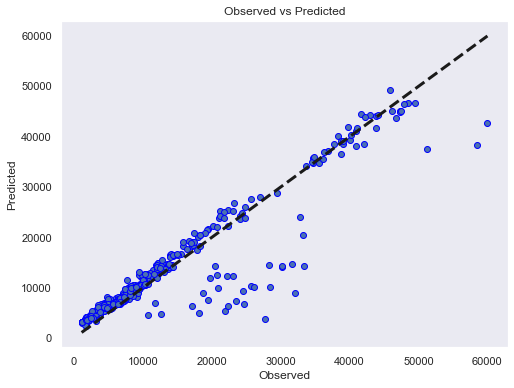

In [ ]:
# So plot observed and predicted values of the test data for the best model i.e. tuned gradient boosting model
fig, ax = plt.subplots(figsize=(8, 6))
y_pred=gb_tuned.predict(X_test)
ax.scatter(y_test, y_pred, edgecolors=(0, 0, 1))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
ax.set_xlabel('Observed')
ax.set_ylabel('Predicted')
ax.set_title("Observed vs Predicted")
plt.grid()
plt.show()

- We can see that points are dense on the line where predicted is equal to the observed.
- This implies that most of the predicted values are close to the true values with some exceptions as seen in the plot. 

## Conclusions and Business Recommendations

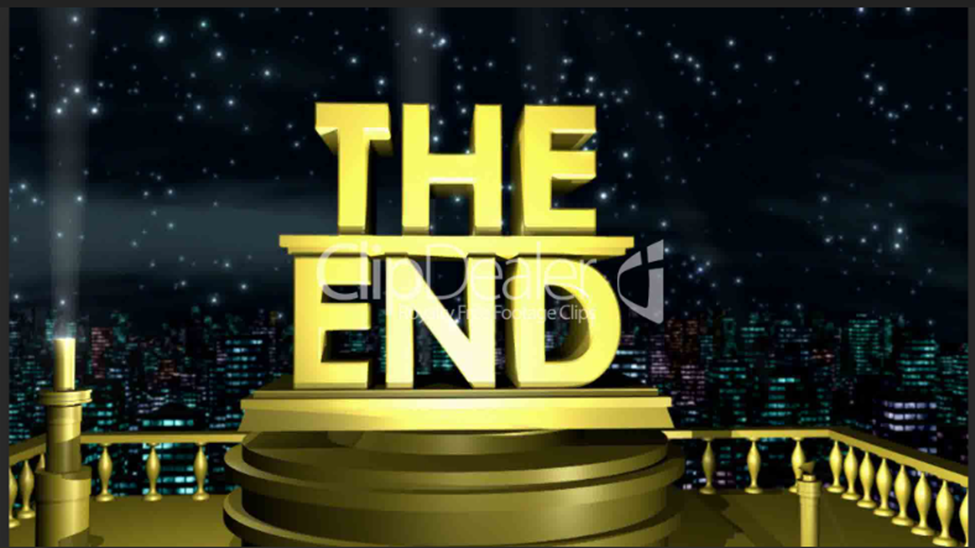

In [ ]:
import pandas as pd
import numpy as np
!pip3 install plotly
!pip3 install plotly --upgrade